# Introduction

This notebook runs all the statistical analysis for the manuscript: "Reinforcement learning during locomotion".

For the statistical analysis, we ran two different models. The first for simple comparisons between two groups (similar to a t-test), and the second for comparisons between groups at different times. For each model, we used a function that was based on Hyosub Kim's Bayes toolbox (https://github.com/hyosubkim/bayes-toolbox) with some slight modifications. 

***

**Models:**

*Simple between group comparisons:*

For simple comparisons between two groups, we assume the outcome data (Y) from each individual subject (i) are generated from a student's t distribution:

$ Y_i \sim T(\nu, \mu_{group}, \sigma_{group}) $

The mean ($\mu$) and standard deviation ($\sigma$) of the distribution depends on group assignment. The degrees of freedom parameter ($\nu$) was set as the same parameter between groups for simplicity. Thus, we estimated the 5 model parameters using Bayes rule. We set the priors for the parameters as follows:

* The two priors for $\mu$ were set as a normal distribution with the same hyper-parameters. We set the mean as the empirical pooled mean ($\bar{x}$) and the standard deviation at two times the empirical pooled standard deviation ($2s$). This provides a reasonably wide prior for the data without favoring one group over the other:

    $ \mu \sim Normal(\bar{x},2s) $
    
* The two priors for $\sigma$ were set as a uniform distribution with the same hyper-parameters. The lower bound was set at a tenth of the empirical pooled standard deviation and the upper bound was set at 10 times the empirical pooled standard deviation. This is quite a wide prior: 

    $ \sigma \sim Uniform(s/10, 10s) $
    
* The $\nu$ parameter was the same for both groups, for simplicity and was set as an exponential distribution with a mean of 30:

    $ \nu \sim Exponential(30) $

*Comparisons with between and within subject factors:*

For comparisons that have both between and within subject facotrs (in this case, group (j) and time (k), respectively), we used a similar model. Assuming that the data were again generated from a students T distribution:

$ Y_i \sim T(\nu, \mu_i, \sigma_{[j, k]}) $

Here notice that the each $\sigma$ depends on group (j) and time (k) factors. Thus, we do not assume that each group and time has the same varance. We used a similar prior for the $\sigma$ parameter as in the simple comparison model, except the lower bound was set at one-hundredth of the empirical sigma. The $\nu$ parameter was also the same as the simple comparison model. The big difference here is the $\mu$ parameter which was different for each individual and dependened on a linear model:

$ \mu_i = \beta_0 + \sum_j \beta_{group [j]} x_{group [j]} (i) + \sum_k \beta_{time [k]} x_{time [k]} (i) + \sum_{j,k} \beta_{g x t [j,k]} x_{g x t [j,k]} (i) $

We set a the prior for each $\beta$ parameter as a normal distribution with a mean of 0 and a standard deviation that was sampled from a gamma distribution with a shape and rate set as half the mode and twice the standard deviation of the empirical data. This provides a broad range on the scale of the data. The only $\beta$ parameter that was different was the $\beta_0$ parameter which was set as a normal distribution with a mean and standard deviation set at the empirical mean and standard deviation. 

***

**Organization:**

For each statistical model the code follow these steps:

1. Fit a the model to the data using a customized function that was based on Hyosub Kim's Bayes toolbox (https://github.com/hyosubkim/bayes-toolbox) with some slight modifications. 
2. Perform model checks which include:
    1. Check the trace. The trace plots each sample from the posterior and its corresponding value. Since the MCMC algorithm should sample from values of the posterior in porportion to its probability, the trace should appear like the distribution of the parameters set by the prior and collected in the data. 
    2. Run a posterior predictive check. This check plots a few samples of the posterior distributions against the emperical data. Since the posterior distribution represents the data generating process, it should appear like the distribution could have generated the data. 
3. Analyze the posterior. Sample the comparisons of interest from the posterior and comapre the groups. Here I have more comparisons then are reported in the mansucript.
***

# Setup

## Import libraries

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import bayes_toolbox.glm as bst
import os
import pandas as pd
import arviz as az
import pymc as pm
from scipy import stats
from scipy.stats import t
from scipy.stats import norm
import aesara.tensor as at

print(f"Running on PyMC v{pm.__version__}")

# Set colors for plotting
rpe_color = '#c51b7d'
te_color = '#276419'
plt.rcParams.update({'font.size': 18})

#Pymc sampling
seed_num = 100
n_samples = 10000

grp_names = ['RPE', 'TE']

Running on PyMC v4.3.0


## Define Functions

In [3]:
def robust_bayesian_mixed_model_anova(between_subj_var, within_subj_var, subj_id, y, n_draws=1000, rnd_seed=100):
    """Performs Bayesian analogue of mixed model (split-plot) ANOVA.
    
    Models instance of outcome resulting from both between- and within-subjects
    factors. Outcome is measured several times from each observational unit (i.e.,
    repeated measures). 
    
    Args:
        between_subj_var: The between-subjects variable.
        withing_subj_var: The within-subjects variable.
        subj_id: The subj ID variable. 
        y: The outcome variable. 
    
    Returns: 
        PyMC Model and InferenceData objects. 
    """
    # Statistical model: Split-plot design after Kruschke Ch. 20
    # Between-subjects factor (i.e., group)
    x_between, levels_x_between, num_levels_x_between = bst.parse_categorical(between_subj_var)
  
    # Within-subjects factor (i.e., target set)
    x_within, levels_x_within, num_levels_x_within = bst.parse_categorical(within_subj_var)

    # Individual subjects
    x_subj, levels_x_subj, num_levels_x_subj = bst.parse_categorical(subj_id)

    # Dependent variable 
    mu_y = y.mean()
    sigma_y = y.std()

    a_shape, a_rate = bst.gamma_shape_rate_from_mode_sd(sigma_y / 2 , 2 * sigma_y)

    with pm.Model(coords={
        "between_subj": levels_x_between, 
        "within_subj": levels_x_within,
        "subj": levels_x_subj}
        ) as model:

        # Baseline value
        a0 = pm.Normal('a0', mu=mu_y, sigma=sigma_y * 5)

        # Deflection from baseline for between subjects factor
        sigma_B = pm.Gamma('sigma_B', a_shape, a_rate)
        aB = pm.Normal('aB', mu=0.0, sigma=sigma_B, dims="between_subj")

        # Deflection from baseline for within subjects factor
        sigma_W = pm.Gamma('sigma_W', a_shape, a_rate)
        aW = pm.Normal('aW', mu=0.0, sigma=sigma_W, dims="within_subj")

        # Deflection from baseline for combination of between and within subjects factors
        sigma_BxW = pm.Gamma('sigma_BxW', a_shape, a_rate)
        aBxW = pm.Normal('aBxW', mu=0.0, sigma=sigma_BxW, dims=("between_subj", "within_subj"))

        # Deflection from baseline for individual subjects
        sigma_S = pm.Gamma('sigma_S', a_shape, a_rate)
        aS = pm.Normal('aS', mu=0.0, sigma=sigma_S, dims="subj")

        mu = a0 + aB[x_between] + aW[x_within] + aBxW[x_between, x_within] + aS[x_subj] 
        
        #Assumes different variances 
        sigma = pm.Uniform('sigma', lower=sigma_y / 100, upper=sigma_y * 10, dims=("between_subj", "within_subj"))

        #Prior on nu parameter
        nu_minus1 = pm.Exponential('nu_minus1', 1 / 29)
        nu = pm.Deterministic('nu', nu_minus1 + 1)     
        
        # Define likelihood 
        likelihood = pm.StudentT('likelihood', nu=nu, mu=mu, sigma=sigma[x_between, x_within], observed=y)
        
        # Sample from the posterior
        idata = pm.sample(draws=n_draws, tune=2000, target_accept=0.95, random_seed=rnd_seed)
    
    return model, idata

#------------------------------------------------------------------------------------------------------------------------
#------------------------------------------------------------------------------------------------------------------------

def BEST(y, group, n_draws=1000, rnd_seed=100):
    """Implementation of John Kruschke's BEST test.
    
    Estimates parameters related to outcomes of two groups. See:
        https://jkkweb.sitehost.iu.edu/articles/Kruschke2013JEPG.pdf
        for more details. 
    
    Args:
        y (ndarray/Series): The metric outcome variable.
        group: The grouping variable providing that indexes into y.
        n_draws: Number of random samples to draw from the posterior.
    
    Returns: 
        PyMC Model and InferenceData objects.
    """
    
    # Convert grouping variable to categorical dtype if it is not already
    if pd.api.types.is_categorical_dtype(group):
        pass
    else:
        group = group.astype('category')
    group_idx = group.cat.codes.values
        
    # Extract group levels and make sure there are only two
    level = group.cat.categories
    assert len(level) == 2, f"Expected two groups but got {len(level)}."
    
    # Calculate pooled empirical mean and SD of data to scale hyperparameters
    mu_y = y.mean()
    sigma_y = y.std()
                                                                     
    with pm.Model() as model:
        # Define priors. Arbitrarily set hyperparameters to the pooled 
        # empirical mean of data and twice pooled empirical SD, which 
        # applies very diffuse and unbiased info to these quantities. 
        group_mean = pm.Normal("group_mean", mu=mu_y, sigma=sigma_y * 2, shape=len(level))
        group_std = pm.Uniform("group_std", lower=sigma_y / 10, upper=sigma_y * 10, shape=len(level))
        
        # See Kruschke Ch 16.2.1 for in-depth rationale for prior on nu. The addition of 1 is to shift the
        # distribution so that the range of possible values of nu are 1 to infinity (with mean of 30).
        nu_minus_one = pm.Exponential("nu_minus_one", 1 / 29)
        nu = pm.Deterministic("nu", nu_minus_one + 1)
        nu_log10 = pm.Deterministic("nu_log10", np.log10(nu))
        
        # Define likelihood
        likelihood = pm.StudentT("likelihood", nu=nu, mu=group_mean[group_idx], sigma=group_std[group_idx], observed=y)
        
        # Contrasts of interest
        diff_of_means = pm.Deterministic("difference of means", group_mean[0] - group_mean[1])
        diff_of_stds = pm.Deterministic("difference of stds", group_std[0] - group_std[1])
        effect_size = pm.Deterministic(
            "effect size", diff_of_means / np.sqrt((group_std[0]**2 + group_std[1]**2) / 2)
        )
        
        # Sample from posterior
        idata = pm.sample(draws=n_draws, tune=2000, random_seed=rnd_seed)
        
    return model, idata

#------------------------------------------------------------------------------------------------------------------------
#------------------------------------------------------------------------------------------------------------------------

def plot_post_predictive_ttest(data, group, post, n_samps=20):
    
    grp_names = pd.unique(group)
    var_name = data.name
    # Set colors for plotting

    grp_colors = ['#c51b7d', '#276419']
    
    x = np.linspace(np.min(post.group_mean)-np.max(post.group_std),np.max(post.group_mean)+np.max(post.group_std))
    rand_idx = np.random.choice(len(post.group_mean[0,:]), n_samps)

    fig, ax = plt.subplots(1,2, figsize=(12,3))
    ax[0].hist(data[group==grp_names[0]], bins=10, density=True, alpha=0.5, color=grp_colors[0])
    for i in rand_idx:
        y = t.pdf(x, df=post.nu[i], loc=post.group_mean[0,i], scale=post.group_std[0,i])
        ax[0].plot(x, y, c=grp_colors[0], alpha=0.2)
    ax[0].set(title=grp_names[0]+' group', ylabel='probability', xlabel=var_name)

    ax[1].hist(data[group==grp_names[1]],bins=10, density=True, alpha=0.5, color=grp_colors[1])
    for i in rand_idx:
        y = t.pdf(x, df=post.nu[i], loc=post.group_mean[1,i], scale=post.group_std[1,i])
        ax[1].plot(x, y, c=grp_colors[1], alpha=0.2)
    ax[1].set(title=grp_names[1]+' group', xlabel=var_name)
    
    plt.show()
    
#------------------------------------------------------------------------------------------------------------------------
#------------------------------------------------------------------------------------------------------------------------

def plot_post_simple_comparison(idata, grp_names, round_to):

    az.plot_posterior(
        idata,
        var_names=["difference of means", "difference of stds", "effect size"],
        ref_val=0,
        color="#87ceeb",
        kind="hist",
        round_to=round_to,
        point_estimate="mean",
        bins=50,
        hdi_prob=0.95,
    );
    
    summary = az.summary(idata,hdi_prob=0.95)

    print(grp_names[0], 'mean [95% HDI] =', round(summary['mean'][0],round_to), '[', round(summary['hdi_2.5%'][0],round_to), round(summary['hdi_97.5%'][0],round_to), ']')
    print(grp_names[1], 'mean [95% HDI] =', round(summary['mean'][1],round_to), '[', round(summary['hdi_2.5%'][1],round_to), round(summary['hdi_97.5%'][1],round_to), ']')
    print('Difference of means =', round(summary['mean'][7],round_to), '[', round(summary['hdi_2.5%'][7],round_to), round(summary['hdi_97.5%'][7],round_to), ']')
      
#------------------------------------------------------------------------------------------------------------------------
#------------------------------------------------------------------------------------------------------------------------

def plot_mustache_tdist(mu, sigma, nu, plot_pos, width, color, ax=None):
    for m, s, n in zip(mu, sigma, nu):

        rv = t(df=n, loc=m, scale=s)
        yrange = np.linspace(rv.ppf(0.01), rv.ppf(0.99), 100)
        xrange = rv.pdf(yrange)
        xrange_scaled = xrange*(width/xrange.max())
        ax.plot(-xrange_scaled+plot_pos, yrange, color=color, alpha=.2)
        
#------------------------------------------------------------------------------------------------------------------------
#------------------------------------------------------------------------------------------------------------------------

def plot_posterior_predictive_anova_robust(between_subj, within_subj, y, post, n_mustaches):
            
    #Index group names
    bs_names = pd.unique(between_subj)
    ws_names = pd.unique(within_subj)
    
    #For indexing posterior
    burn_in = post.tuning_steps
    all_post_idx = np.arange(len(post.sample))
    post_idx = np.random.randint(burn_in+1, all_post_idx[-1], n_mustaches)
    
    #Plot prep
    group_colors = ['#c51b7d', '#276419']
    x_offset = [-0.15, 0.15]
    
    #Initilize plot
    fig, ax = plt.subplots(figsize=(10,5),tight_layout=True)
    ax.plot(np.arange(0,len(ws_names)+2), np.zeros(len(ws_names)+2), 'k')
    
    for ws_idx, ws in enumerate(ws_names):
        for bs_idx, bs in enumerate(bs_names):
            #Index and plot emperical data
            y_emp = y[within_subj==ws][between_subj==bs]
            x = norm.rvs(1+ws_idx+x_offset[bs_idx],0.005,len(y_emp))
            ax.plot(x, y_emp, 'o', c=group_colors[bs_idx], mec='w', alpha=0.5)
            
            #Index and plot posterior data
            plot_mustache_tdist(mu=post.b0.values[post_idx]+
                          post.bB.sel(between_subj=bs).values[post_idx]+
                          post.bW.sel(within_subj=ws).values[post_idx]+
                          post.bBxW.sel(between_subj=bs,within_subj=ws).values[post_idx], 
                          sigma=post.sigma.sel(between_subj=bs,within_subj=ws).values[post_idx], 
                          nu=post.nu.values[post_idx], 
                          plot_pos=0.95+ws_idx+x_offset[bs_idx], 
                          width=0.15, 
                          color=group_colors[bs_idx], ax=ax)
            
    ax.set(xlim=(0.5, len(ws_names)+0.5), 
           xticks=np.arange(1,len(ws_names)+1), 
           xticklabels=ws_names, 
           ylabel=y.name, 
           title='Posterior Predictive Check (' + y.name + ')'
          )
    plt.show()

#------------------------------------------------------------------------------------------------------------------------
#------------------------------------------------------------------------------------------------------------------------

def plot_between_contrasts(post, between_subj, within_subj, round_to):

    #Index the between and within subject names
    bs_names = pd.unique(between_subj)
    ws_names = pd.unique(within_subj)
    
    print('Interactions:')
    
    #Index the interaction contrasts
    contrast_dict = {}
    for ws_idx, ws in enumerate(ws_names):
        single_contrast = []
        for bs_idx, bs in enumerate(bs_names):
            
            post_indiv = post.b0 + post.bB.sel(between_subj=bs) + post.bW.sel(within_subj=ws) + post.bBxW.sel(between_subj=bs,within_subj=ws)
            post_hdi = az.hdi(post_indiv.values, hdi_prob=0.95)
            print('Posterior for', bs, ws, '=', np.round(np.mean(post_indiv.values),round_to), np.round(post_hdi,round_to))
         
            single_contrast.append(post_indiv)

        contrast_str = bs_names[0] + ' vs ' + bs_names[1] + ' @ ' + ws
        contrast = single_contrast[0] - single_contrast[1]        
        contrast_hdi = az.hdi(contrast.values, hdi_prob=0.95)
        
        print(contrast_str, '=', np.round(np.mean(contrast.values),round_to), np.round(contrast_hdi,round_to))
        print(' ')
        
        contrast_dict[contrast_str] = contrast
    az.plot_posterior(contrast_dict, 
                      kind="hist",
                      combine_dims={"sample"},
                      bins=50,
                      point_estimate="mean", 
                      ref_val=0,
                      round_to=round_to,
                      hdi_prob=0.95);
    
    return contrast_dict


## Load the data

In [4]:
#Change the directory
os.chdir('/Users/jonathanwood/Documents/GitHub/Reinforcement-learning-during-locomotion/Data')

#Load experiment 1 data
df1 = pd.read_csv('E1_results_anova.txt')

#Load exploration data
df_var = pd.read_csv('variability_anova.txt')
df1_var = df_var[df_var.experiment==1]
df2_var = df_var[df_var.experiment==2]

#Load experiment 2 data
df2 = pd.read_csv('E2_results_anova.txt')

# Experiment 1

## Learning

### Late Learning

In [5]:
#Run the model
model_lrn_e1, idata_lrn_e1 = BEST(y=df1.learning[df1.time=="Late"], 
                                  group=df1.group[df1.time=="Late"],
                                  n_draws=n_samples, rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [group_mean, group_std, nu_minus_one]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 32 seconds.


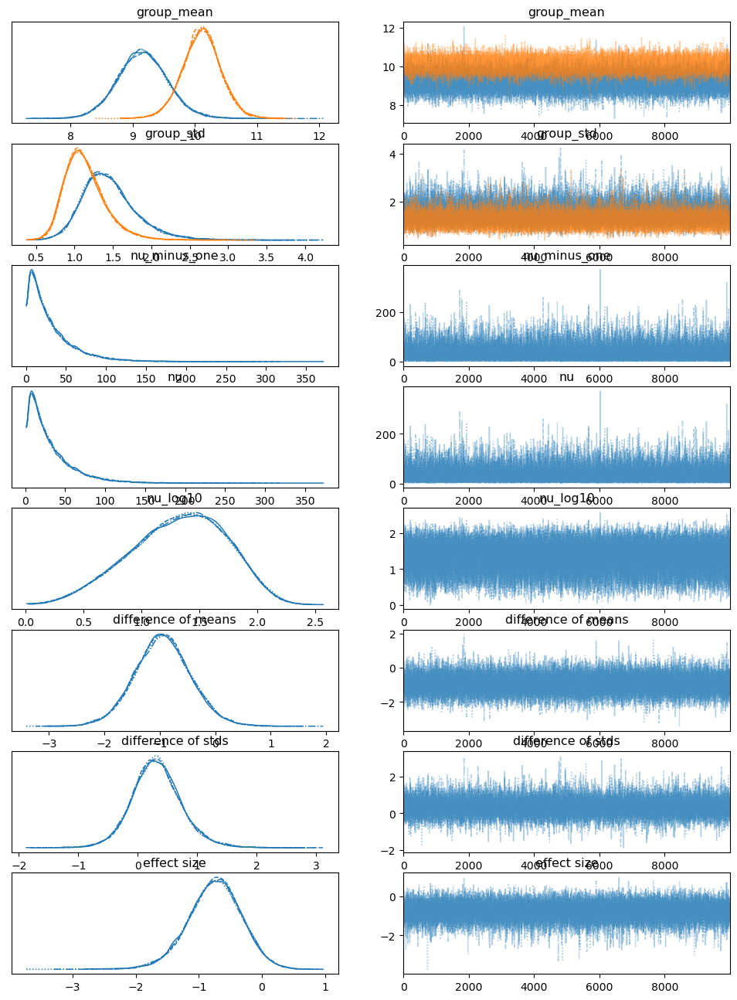

In [6]:
az.plot_trace(idata_lrn_e1);

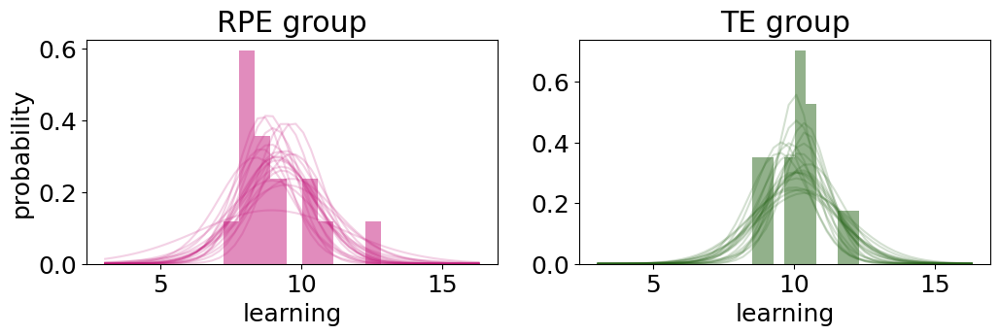

In [7]:
#Extract posterior
post_lrn_e1 = az.extract(idata_lrn_e1)

#Plot posterior predictive
plot_post_predictive_ttest(df1.learning[df1.time=="Late"],
                           df1.group[df1.time=="Late"], 
                           post_lrn_e1, 
                           n_samps=20)

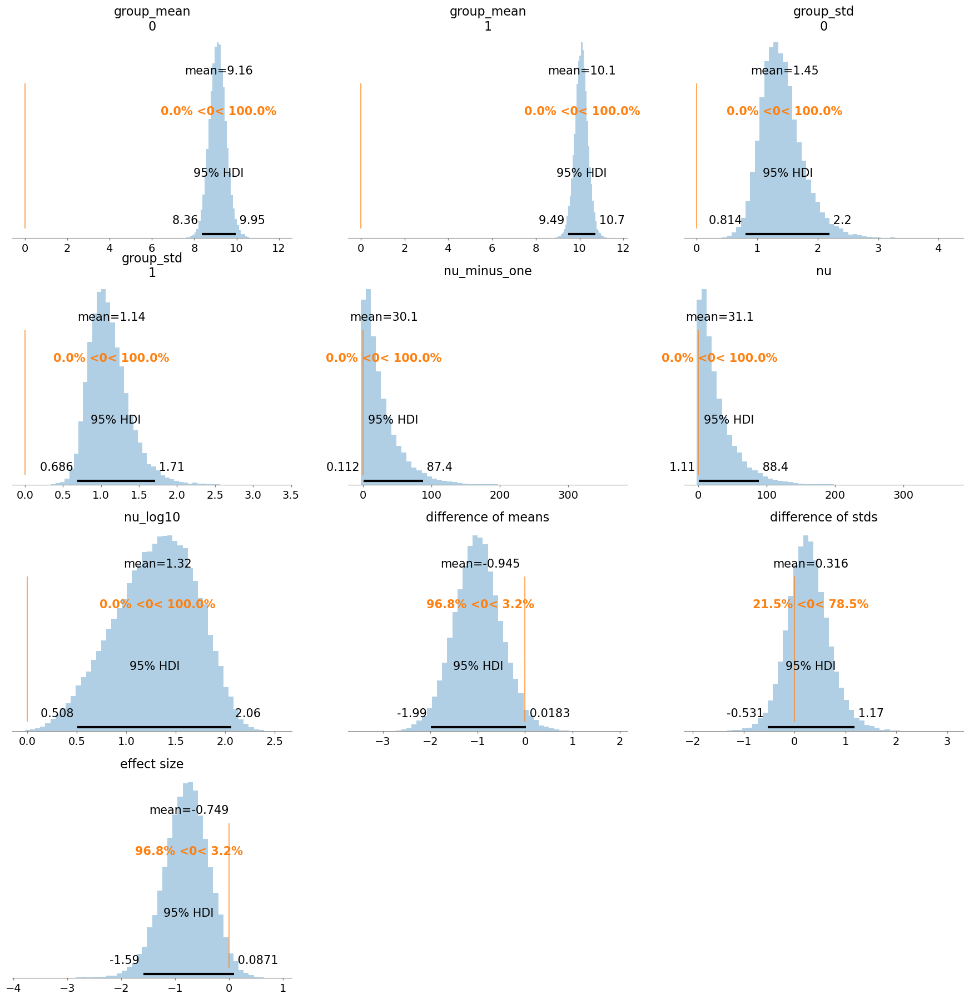

In [19]:
#Plot
az.plot_posterior(idata_lrn_e1, 
                  kind="hist",
                  combine_dims={"sample"},
                  bins=50,
                  point_estimate="mean", 
                  ref_val=0,
                  round_to=3,
                  hdi_prob=0.95);

RPE mean [95% HDI] = 9.16 [ 8.36 9.95 ]
TE mean [95% HDI] = 10.11 [ 9.49 10.71 ]
Difference of means = -0.94 [ -1.99 0.02 ]


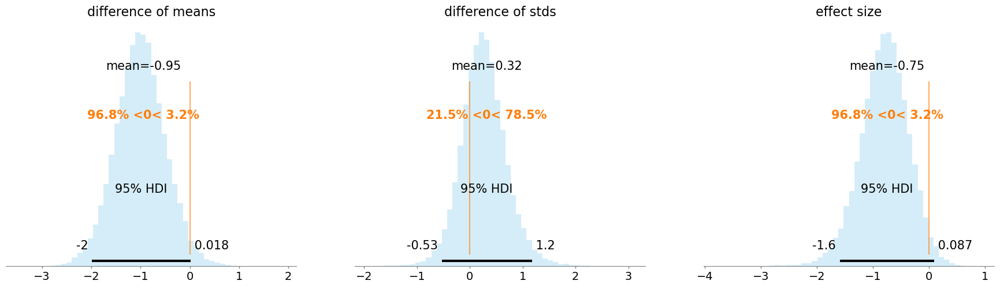

In [8]:
plot_post_simple_comparison(idata_lrn_e1, grp_names, round_to=2)

### Error

In [9]:
#Run the model
model_error_e1, idata_error_e1 = robust_bayesian_mixed_model_anova(between_subj_var=df1.group, 
                                                                   within_subj_var=df1.time, 
                                                                   subj_id=df1.subj_id, 
                                                                   y=df1.error, 
                                                                   n_draws=n_samples, 
                                                                   rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a0, sigma_B, aB, sigma_W, aW, sigma_BxW, aBxW, sigma_S, aS, sigma, nu_minus1]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 3478 seconds.


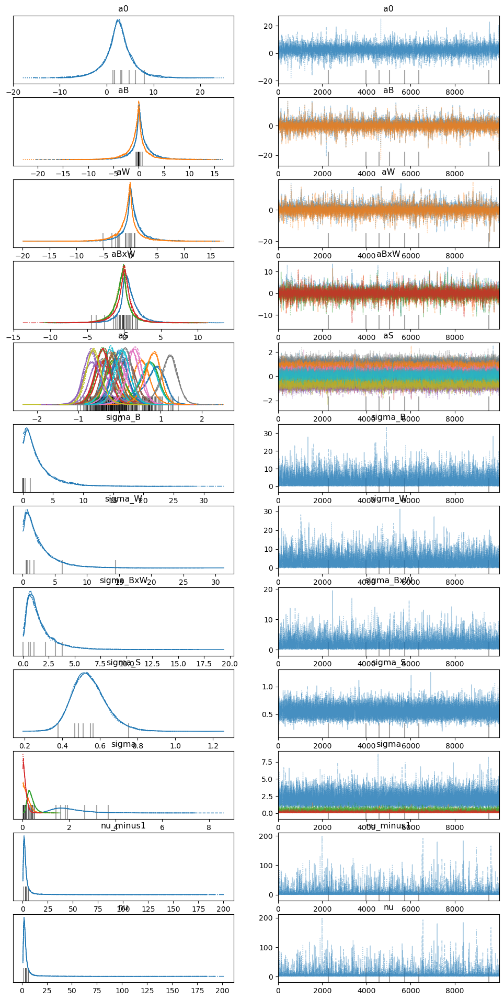

In [15]:
az.plot_trace(idata_error_e1);

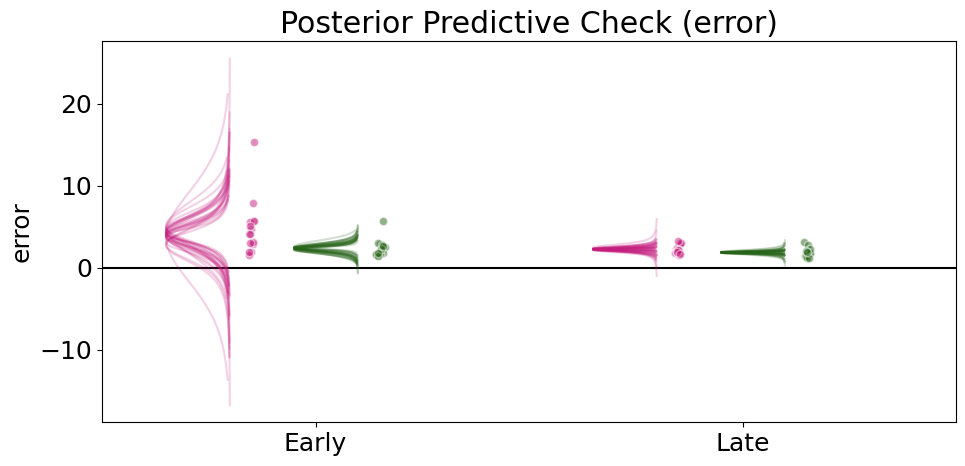

In [16]:
# Convert coefficients to sum-to-zero deflections
post_error_e1 = bst.convert_to_sum_to_zero(idata_error_e1, 
                                           df1.group, 
                                           df1.time, 
                                           df1.subj_id)

#Plot posterior predictive
plot_posterior_predictive_anova_robust(between_subj=df1.group, 
                                       within_subj=df1.time, 
                                       y=df1.error, 
                                       post=post_error_e1, 
                                       n_mustaches=25)

Interactions:
Posterior for RPE Early = 3.91 [2.628 5.111]
Posterior for TE Early = 2.295 [2.057 2.535]
RPE vs TE @ Early = 1.615 [0.321 2.839]
 
Posterior for RPE Late = 2.253 [2.082 2.418]
Posterior for TE Late = 1.857 [1.738 1.952]
RPE vs TE @ Late = 0.396 [0.2   0.585]
 


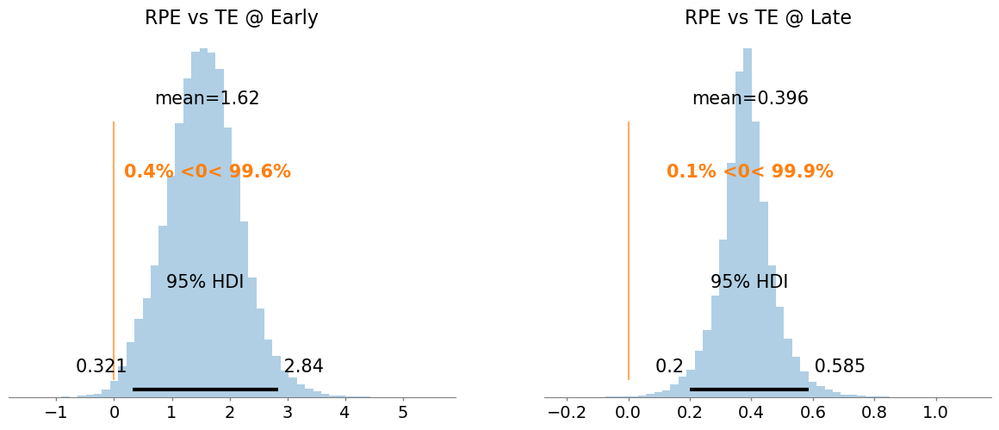

In [17]:
#Between subject contrasts at both timepoints
contrast_dict_e1error = plot_between_contrasts(post_error_e1, 
                                               between_subj=df1.group, 
                                               within_subj=df1.time, 
                                               round_to=3)

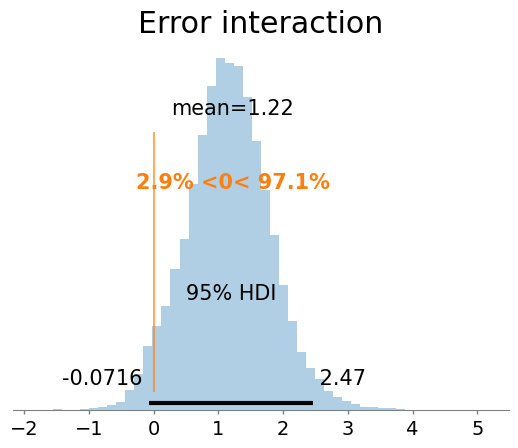

In [18]:
#Interaction effect

#Index posteriors
post_rpe_early = post_error_e1.b0 + post_error_e1.bB.sel(between_subj='RPE') + post_error_e1.bW.sel(within_subj='Early') + post_error_e1.bBxW.sel(between_subj='RPE',within_subj='Early')
post_te_early = post_error_e1.b0 + post_error_e1.bB.sel(between_subj='TE') + post_error_e1.bW.sel(within_subj='Early') + post_error_e1.bBxW.sel(between_subj='TE',within_subj='Early')

post_rpe_late = post_error_e1.b0 + post_error_e1.bB.sel(between_subj='RPE') + post_error_e1.bW.sel(within_subj='Late') + post_error_e1.bBxW.sel(between_subj='RPE',within_subj='Late')
post_te_late = post_error_e1.b0 + post_error_e1.bB.sel(between_subj='TE') + post_error_e1.bW.sel(within_subj='Late') + post_error_e1.bBxW.sel(between_subj='TE',within_subj='Late')

#Differences
time_diff_rpe = post_rpe_early - post_rpe_late
time_diff_te = post_te_early - post_te_late
error_interaction_e1 = time_diff_rpe - time_diff_te

#Plot
az.plot_posterior(error_interaction_e1, 
                  kind="hist",
                  combine_dims={"sample"},
                  bins=50,
                  point_estimate="mean", 
                  ref_val=0,
                  round_to=3,
                  hdi_prob=0.95);
plt.title('Error interaction')
plt.show()

### Percent success


In [21]:
#Run the model
model_success_e1, idata_success_e1 = robust_bayesian_mixed_model_anova(between_subj_var=df1.group, 
                                                                       within_subj_var=df1.time, 
                                                                       subj_id=df1.subj_id, 
                                                                       y=df1.success, 
                                                                       n_draws=n_samples, 
                                                                       rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a0, sigma_B, aB, sigma_W, aW, sigma_BxW, aBxW, sigma_S, aS, sigma, nu_minus1]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 29753 seconds.


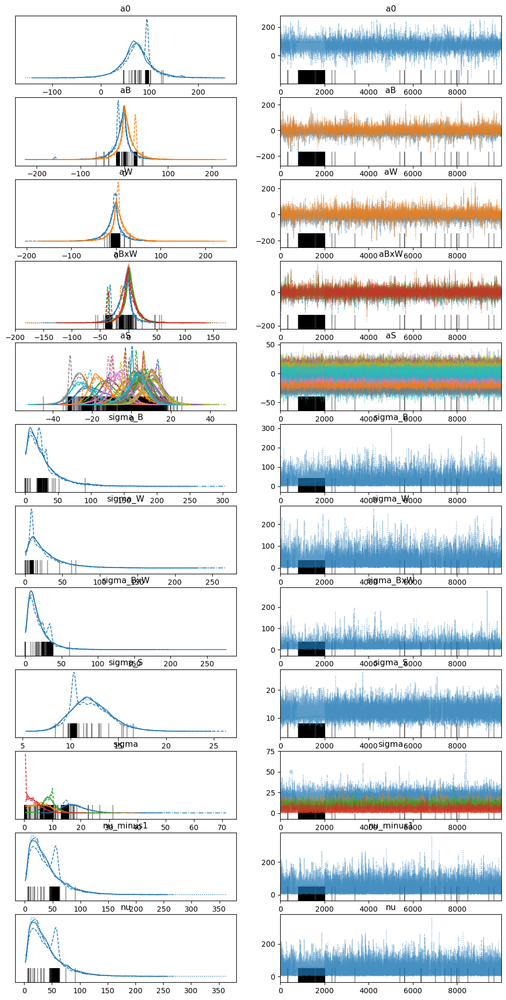

In [27]:
az.plot_trace(idata_success_e1);

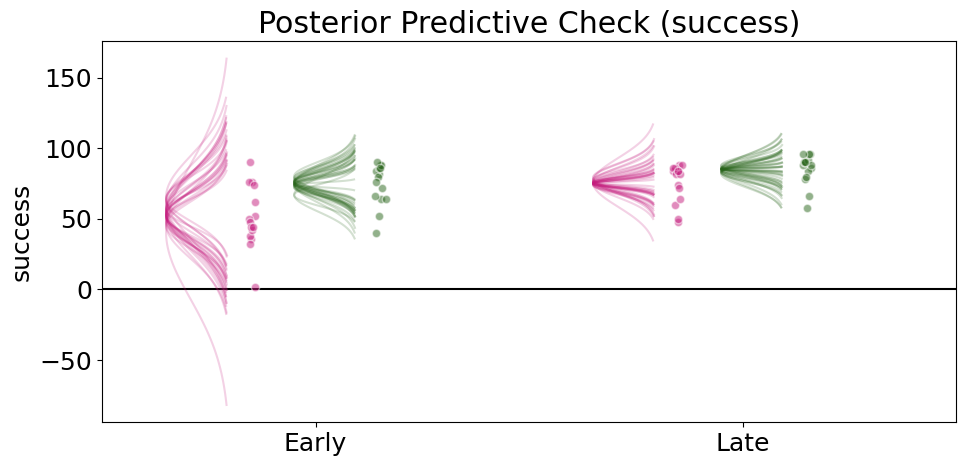

In [28]:
# Convert coefficients to sum-to-zero deflections
post_success_e1 = bst.convert_to_sum_to_zero(idata_success_e1, 
                                             df1.group, 
                                             df1.time, 
                                             df1.subj_id)

#Plot posterior predictive
plot_posterior_predictive_anova_robust(between_subj=df1.group, 
                                       within_subj=df1.time, 
                                       y=df1.success, 
                                       post=post_success_e1, 
                                       n_mustaches=25)

Interactions:
Posterior for RPE Early = 52.481 [42.578 63.419]
Posterior for TE Early = 74.371 [69.382 79.206]
RPE vs TE @ Early = -21.89 [-33.067 -10.229]
 
Posterior for RPE Late = 75.35 [71.185 79.556]
Posterior for TE Late = 85.225 [82.717 87.835]
RPE vs TE @ Late = -9.875 [-14.724  -5.114]
 


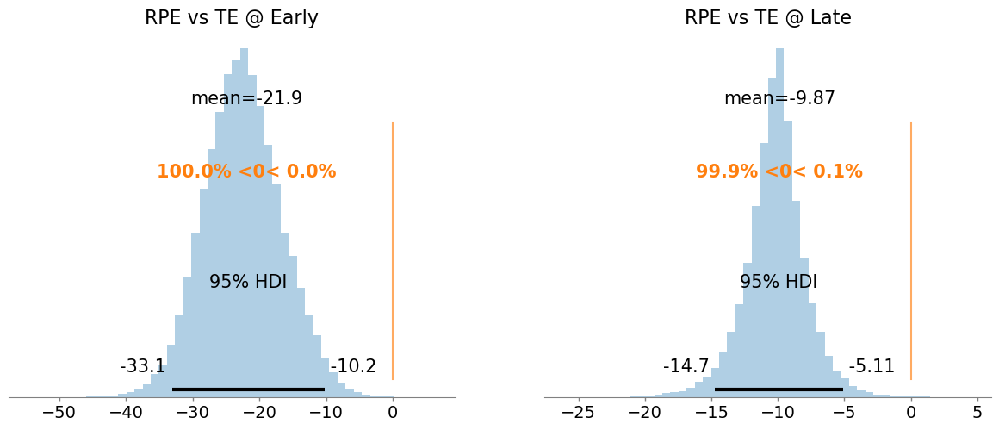

In [29]:
#Between subject contrasts at both timepoints
contrast_dict_e1success = plot_between_contrasts(post_success_e1, 
                                                 between_subj=df1.group, 
                                                 within_subj=df1.time, 
                                                 round_to=3)

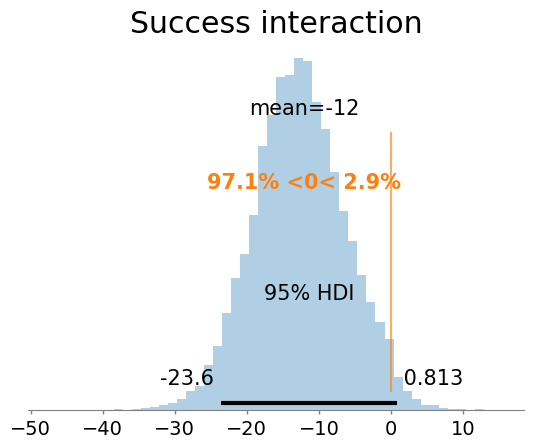

In [30]:
#Interaction effect

#Index posteriors
post_rpe_early = post_success_e1.b0 + post_success_e1.bB.sel(between_subj='RPE') + post_success_e1.bW.sel(within_subj='Early') + post_success_e1.bBxW.sel(between_subj='RPE',within_subj='Early')
post_te_early = post_success_e1.b0 + post_success_e1.bB.sel(between_subj='TE') + post_success_e1.bW.sel(within_subj='Early') + post_success_e1.bBxW.sel(between_subj='TE',within_subj='Early')

post_rpe_late = post_success_e1.b0 + post_success_e1.bB.sel(between_subj='RPE') + post_success_e1.bW.sel(within_subj='Late') + post_success_e1.bBxW.sel(between_subj='RPE',within_subj='Late')
post_te_late = post_success_e1.b0 + post_success_e1.bB.sel(between_subj='TE') + post_success_e1.bW.sel(within_subj='Late') + post_success_e1.bBxW.sel(between_subj='TE',within_subj='Late')

#Differences
time_diff_rpe = post_rpe_early - post_rpe_late
time_diff_te = post_te_early - post_te_late
success_interaction_e1 = time_diff_rpe - time_diff_te

#Plot
az.plot_posterior(success_interaction_e1, 
                  kind="hist",
                  combine_dims={"sample"},
                  bins=50,
                  point_estimate="mean", 
                  ref_val=0,
                  round_to=3,
                  hdi_prob=0.95);
plt.title('Success interaction')
plt.show()

## Exploration

### Motor variability

In [32]:
model_var_e1, idata_var_e1 = robust_bayesian_mixed_model_anova(between_subj_var=df1_var.group, 
                                                               within_subj_var=df1_var.time, 
                                                               subj_id=df1_var.subj_id, 
                                                               y=df1_var.variability, 
                                                               n_draws=n_samples,
                                                               rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a0, sigma_B, aB, sigma_W, aW, sigma_BxW, aBxW, sigma_S, aS, sigma, nu_minus1]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 3237 seconds.


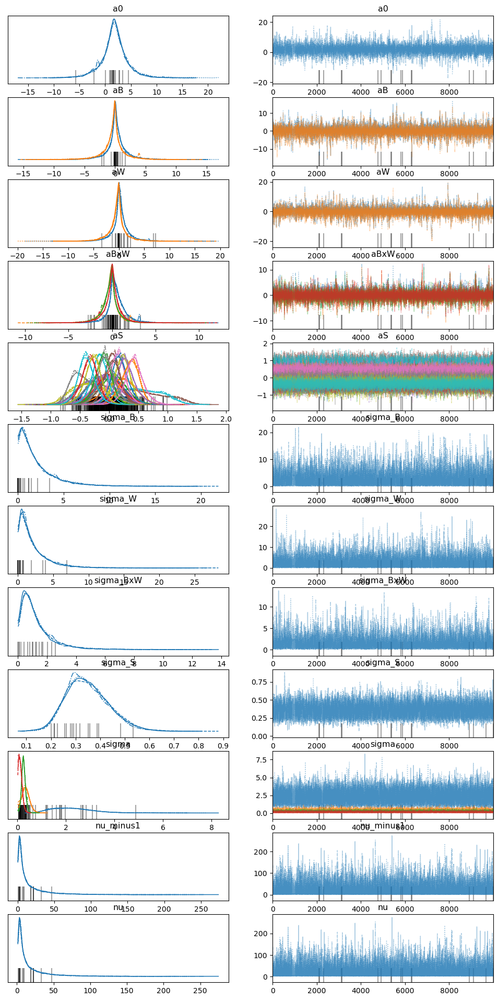

In [33]:
az.plot_trace(idata_var_e1);

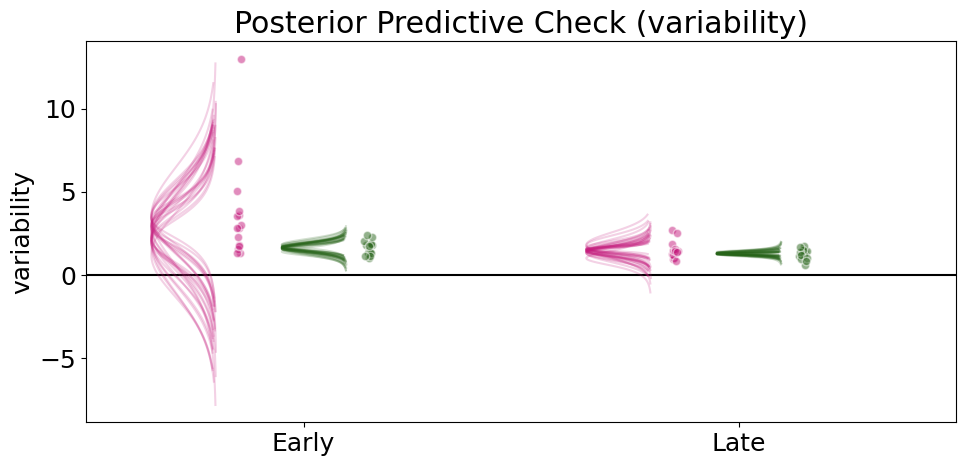

In [34]:
# Convert coefficients to sum-to-zero deflections
post_var_e1 = bst.convert_to_sum_to_zero(idata_var_e1, 
                                               df1_var.group, 
                                               df1_var.time, 
                                               df1_var.subj_id)

#Plot posterior predictive
plot_posterior_predictive_anova_robust(between_subj=df1_var.group, 
                                       within_subj=df1_var.time, 
                                       y=df1_var.variability, 
                                       post=post_var_e1, 
                                       n_mustaches=25)

Interactions:
Posterior for RPE Early = 2.836 [1.572 4.144]
Posterior for TE Early = 1.642 [1.488 1.799]
RPE vs TE @ Early = 1.195 [-0.016  2.565]
 
Posterior for RPE Late = 1.479 [1.243 1.701]
Posterior for TE Late = 1.276 [1.187 1.37 ]
RPE vs TE @ Late = 0.202 [-0.046  0.442]
 


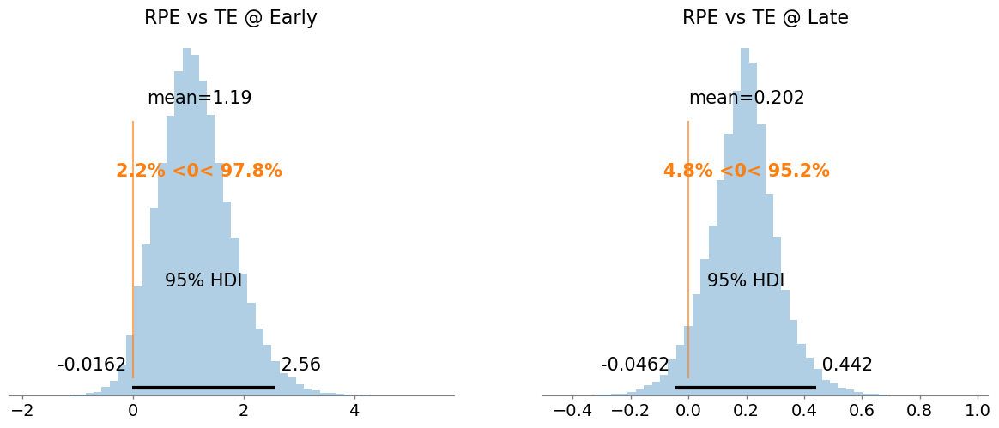

In [35]:
#Between subject contrasts at both timepoints
contrast_dict_e1var = plot_between_contrasts(post_var_e1, 
                                             between_subj=df1_var.group, 
                                             within_subj=df1_var.time, 
                                             round_to=3)

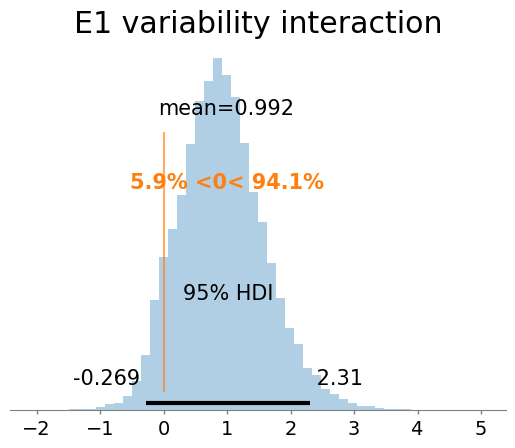

In [36]:
#Interaction effect

#Index posteriors
post_rpe_early = post_var_e1.b0 + post_var_e1.bB.sel(between_subj='RPE') + post_var_e1.bW.sel(within_subj='Early') + post_var_e1.bBxW.sel(between_subj='RPE',within_subj='Early')
post_te_early = post_var_e1.b0 + post_var_e1.bB.sel(between_subj='TE') + post_var_e1.bW.sel(within_subj='Early') + post_var_e1.bBxW.sel(between_subj='TE',within_subj='Early')

post_rpe_late = post_var_e1.b0 + post_var_e1.bB.sel(between_subj='RPE') + post_var_e1.bW.sel(within_subj='Late') + post_var_e1.bBxW.sel(between_subj='RPE',within_subj='Late')
post_te_late = post_var_e1.b0 + post_var_e1.bB.sel(between_subj='TE') + post_var_e1.bW.sel(within_subj='Late') + post_var_e1.bBxW.sel(between_subj='TE',within_subj='Late')

#Differences
time_diff_rpe = post_rpe_early - post_rpe_late
time_diff_te = post_te_early - post_te_late
e1var_interaction = time_diff_rpe - time_diff_te

#Plot
az.plot_posterior(e1var_interaction, 
                  kind="hist",
                  combine_dims={"sample"},
                  bins=50,
                  point_estimate="mean", 
                  ref_val=0,
                  round_to=3,
                  hdi_prob=0.95);
plt.title('E1 variability interaction')
plt.show()

### Win stay lose shift

In [37]:
model_exp_e1, idata_exp_e1 = robust_bayesian_mixed_model_anova(between_subj_var=df1_var.group, 
                                                               within_subj_var=df1_var.exp_time, 
                                                               subj_id=df1_var.subj_id, 
                                                               y=df1_var.wsls, 
                                                               n_draws=n_samples,
                                                               rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a0, sigma_B, aB, sigma_W, aW, sigma_BxW, aBxW, sigma_S, aS, sigma, nu_minus1]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 3203 seconds.


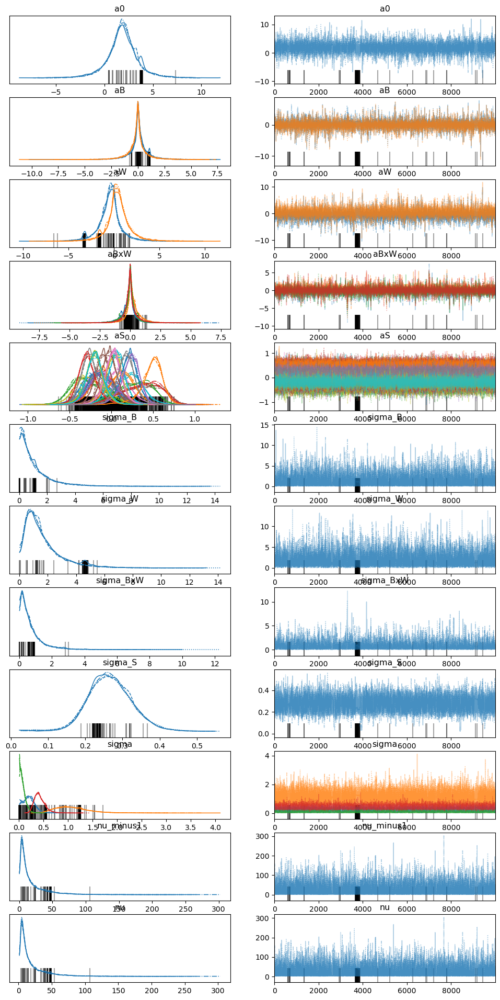

In [38]:
az.plot_trace(idata_exp_e1);

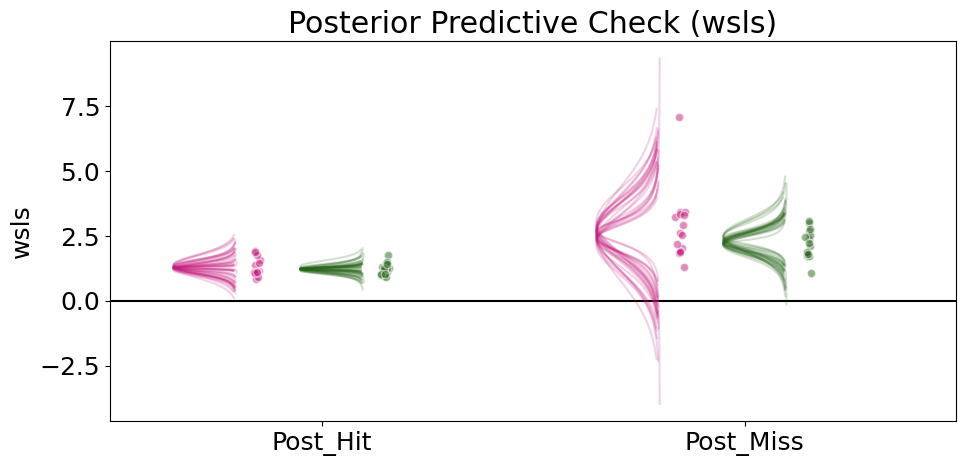

In [39]:
# Convert coefficients to sum-to-zero deflections
post_exp_e1 = bst.convert_to_sum_to_zero(idata_exp_e1, 
                                         df1_var.group, 
                                         df1_var.exp_time, 
                                         df1_var.subj_id)

#Plot posterior predictive
plot_posterior_predictive_anova_robust(between_subj=df1_var.group, 
                                       within_subj=df1_var.exp_time, 
                                       y=df1_var.wsls, 
                                       post=post_exp_e1, 
                                       n_mustaches=25)

Interactions:
Posterior for RPE Post_Hit = 1.289 [1.145 1.426]
Posterior for TE Post_Hit = 1.226 [1.165 1.288]
RPE vs TE @ Post_Hit = 0.063 [-0.085  0.214]
 
Posterior for RPE Post_Miss = 2.616 [2.083 3.205]
Posterior for TE Post_Miss = 2.245 [2.009 2.477]
RPE vs TE @ Post_Miss = 0.371 [-0.171  1.013]
 


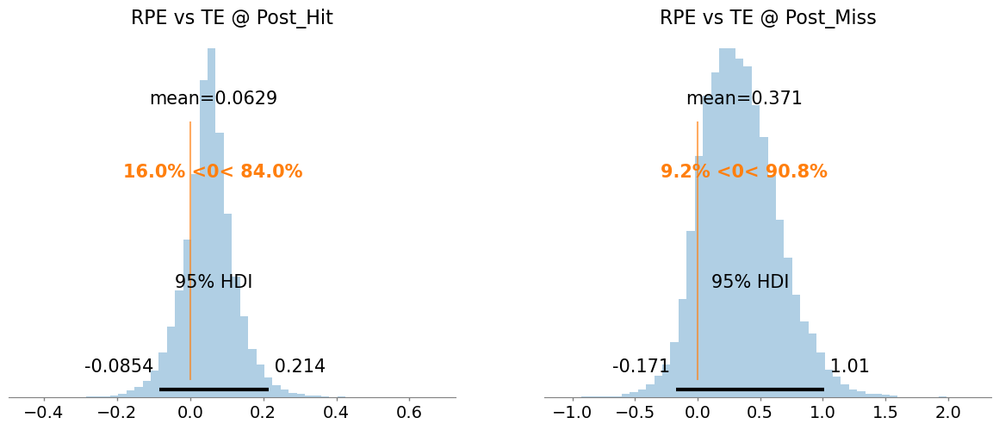

In [40]:
#Between subject contrasts at both timepoints
contrast_dict_e1wsls = plot_between_contrasts(post_exp_e1, 
                                              between_subj=df1_var.group, 
                                              within_subj=df1_var.exp_time, 
                                              round_to=3)

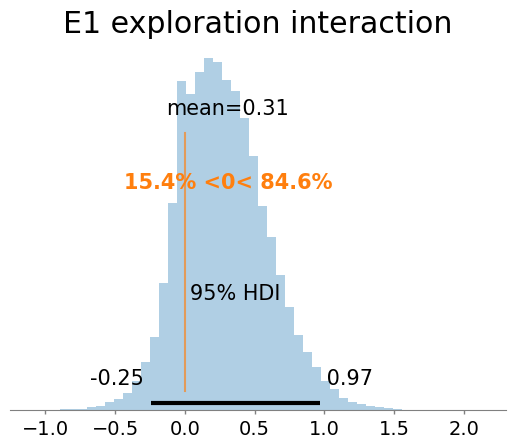

In [41]:
#Interaction effect

#Index posteriors
post_rpe_hit = post_exp_e1.b0 + post_exp_e1.bB.sel(between_subj='RPE') + post_exp_e1.bW.sel(within_subj='Post_Hit') + post_exp_e1.bBxW.sel(between_subj='RPE',within_subj='Post_Hit')
post_te_hit = post_exp_e1.b0 + post_exp_e1.bB.sel(between_subj='TE') + post_exp_e1.bW.sel(within_subj='Post_Hit') + post_exp_e1.bBxW.sel(between_subj='TE',within_subj='Post_Hit')

post_rpe_miss = post_exp_e1.b0 + post_exp_e1.bB.sel(between_subj='RPE') + post_exp_e1.bW.sel(within_subj='Post_Miss') + post_exp_e1.bBxW.sel(between_subj='RPE',within_subj='Post_Miss')
post_te_miss = post_exp_e1.b0 + post_exp_e1.bB.sel(between_subj='TE') + post_exp_e1.bW.sel(within_subj='Post_Miss') + post_exp_e1.bBxW.sel(between_subj='TE',within_subj='Post_Miss')

#Differences
diff_rpe = post_rpe_miss - post_rpe_hit
diff_te = post_te_miss - post_te_hit
e1exp_interaction = diff_rpe - diff_te

#Plot
az.plot_posterior(e1exp_interaction, 
                  kind="hist",
                  combine_dims={"sample"},
                  bins=50,
                  point_estimate="mean", 
                  ref_val=0,
                  round_to=2,
                  hdi_prob=0.95);
plt.title('E1 exploration interaction')
plt.show()

## Washout

### Implicit aftereffect

In [42]:
#Run the model
model_washout_e1, idata_washout_e1 = robust_bayesian_mixed_model_anova(between_subj_var=df1.group, 
                                                                       within_subj_var=df1.time, 
                                                                       subj_id=df1.subj_id, 
                                                                       y=df1.washout, 
                                                                       n_draws=n_samples, 
                                                                       rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a0, sigma_B, aB, sigma_W, aW, sigma_BxW, aBxW, sigma_S, aS, sigma, nu_minus1]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 2350 seconds.


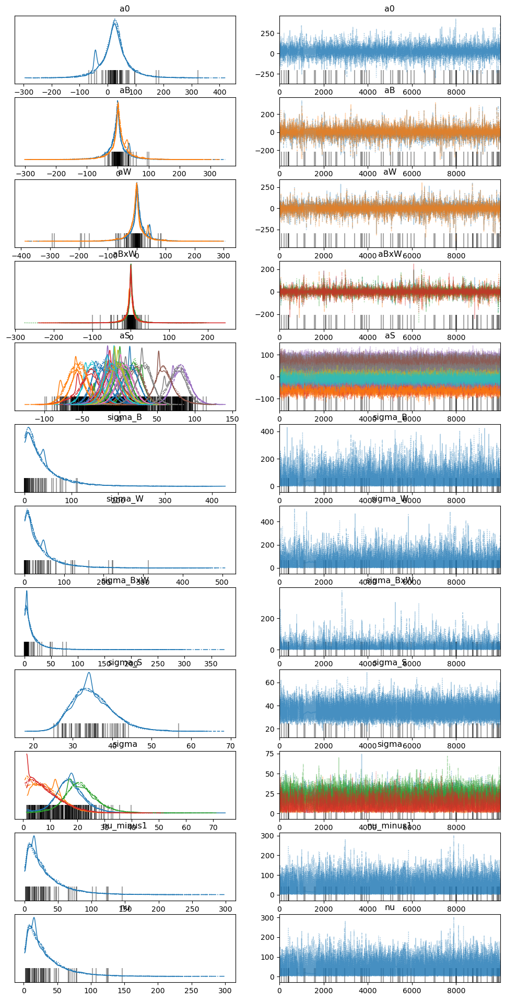

In [43]:
az.plot_trace(idata_washout_e1);

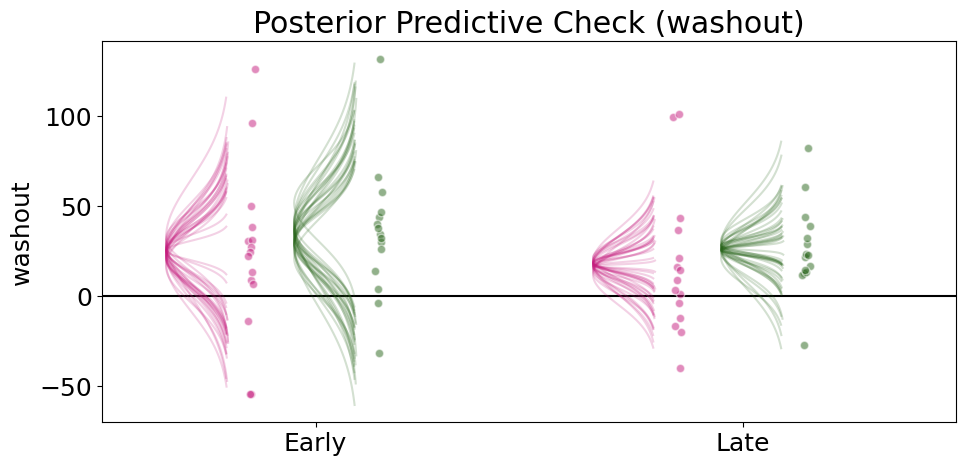

In [44]:
# Convert coefficients to sum-to-zero deflections
post_washout_e1 = bst.convert_to_sum_to_zero(idata_washout_e1, 
                                             df1.group, 
                                             df1.time, 
                                             df1.subj_id)

#Plot posterior predictive
plot_posterior_predictive_anova_robust(between_subj=df1.group, 
                                       within_subj=df1.time, 
                                       y=df1.washout, 
                                       post=post_washout_e1, 
                                       n_mustaches=25)

Interactions:
Posterior for RPE Early = 24.096 [15.004 33.208]
Posterior for TE Early = 34.755 [24.301 45.85 ]
RPE vs TE @ Early = -10.659 [-23.833   2.841]
 
Posterior for RPE Late = 16.984 [11.438 22.927]
Posterior for TE Late = 26.549 [20.538 32.109]
RPE vs TE @ Late = -9.565 [-17.425  -1.906]
 


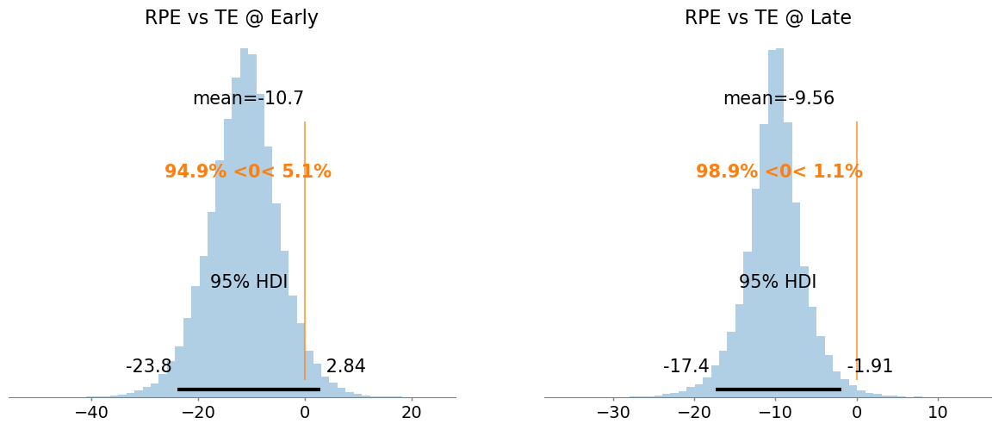

In [45]:
#Between subject contrasts at both timepoints
contrast_dict_wsh = plot_between_contrasts(post_washout_e1, 
                                           between_subj=df1.group, 
                                           within_subj=df1.time, 
                                           round_to=3)

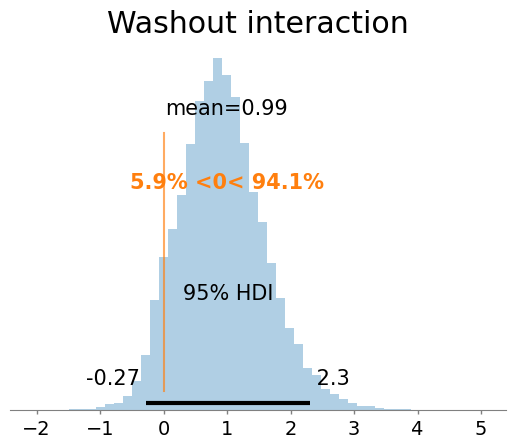

In [46]:
#Interaction effect

#Index posteriors
post_rpe_early_wsh = post_washout_e1.b0 + post_washout_e1.bB.sel(between_subj='RPE') + post_washout_e1.bW.sel(within_subj='Early') + post_washout_e1.bBxW.sel(between_subj='RPE',within_subj='Early')
post_te_early_wsh = post_washout_e1.b0 + post_washout_e1.bB.sel(between_subj='TE') + post_washout_e1.bW.sel(within_subj='Early') + post_washout_e1.bBxW.sel(between_subj='TE',within_subj='Early')

post_rpe_late_wsh = post_washout_e1.b0 + post_washout_e1.bB.sel(between_subj='RPE') + post_washout_e1.bW.sel(within_subj='Late') + post_washout_e1.bBxW.sel(between_subj='RPE',within_subj='Late')
post_te_late_wsh = post_washout_e1.b0 + post_washout_e1.bB.sel(between_subj='TE') + post_washout_e1.bW.sel(within_subj='Late') + post_washout_e1.bBxW.sel(between_subj='TE',within_subj='Late')

#Differences
time_diff_rpe_wsh = post_rpe_early - post_rpe_late
time_diff_te_wsh = post_te_early - post_te_late
washout_interaction = time_diff_rpe - time_diff_te

#Plot
az.plot_posterior(washout_interaction, 
                  kind="hist",
                  combine_dims={"sample"},
                  bins=50,
                  point_estimate="mean", 
                  ref_val=0,
                  round_to=2,
                  hdi_prob=0.95);
plt.title('Washout interaction')
plt.show()

# Experiment 2

## Learning

### Late learning

In [47]:
#Run the model
model_lrn_e2, idata_lrn_e2 = BEST(y=df2.late_lrn[df2.time=="Early"], 
                                  group=df2.group[df2.time=="Early"],
                                  n_draws=n_samples, rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [group_mean, group_std, nu_minus_one]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 34 seconds.


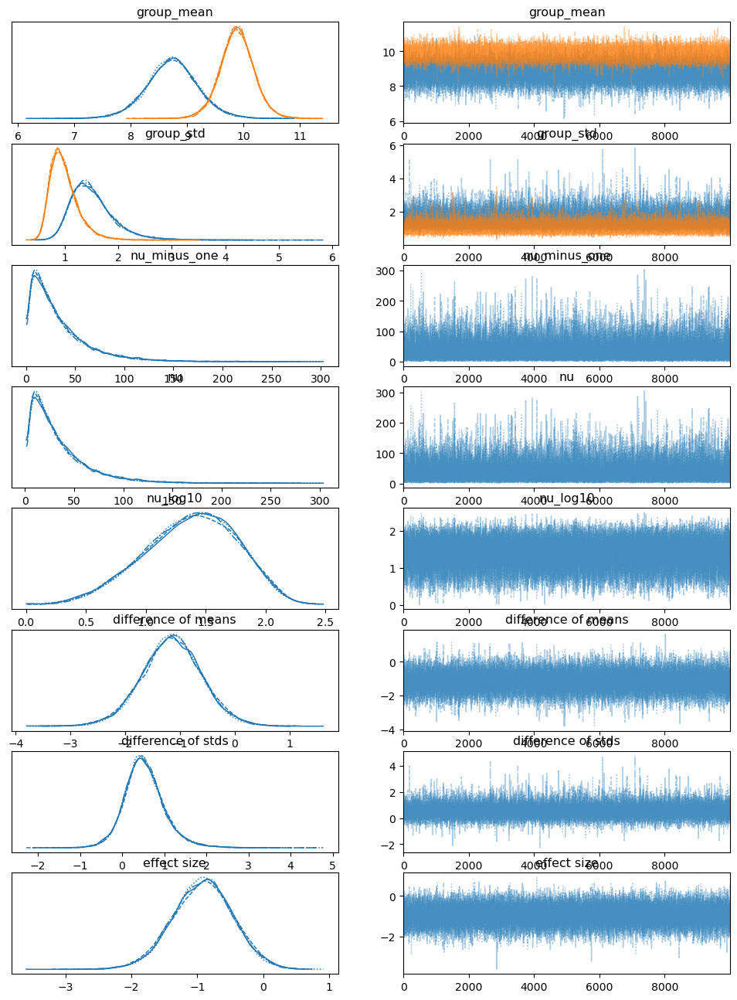

In [48]:
az.plot_trace(idata_lrn_e2);

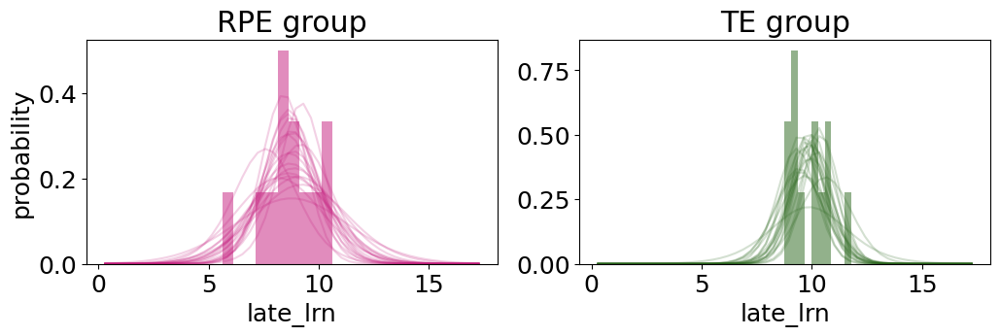

In [49]:
#Extract posterior
post_lrn_e2 = az.extract(idata_lrn_e2)

#Plot posterior predictive
plot_post_predictive_ttest(df2.late_lrn[df2.time=="Early"], 
                           df2.group[df2.time=="Early"], 
                           post_lrn_e2, 
                           n_samps=20)

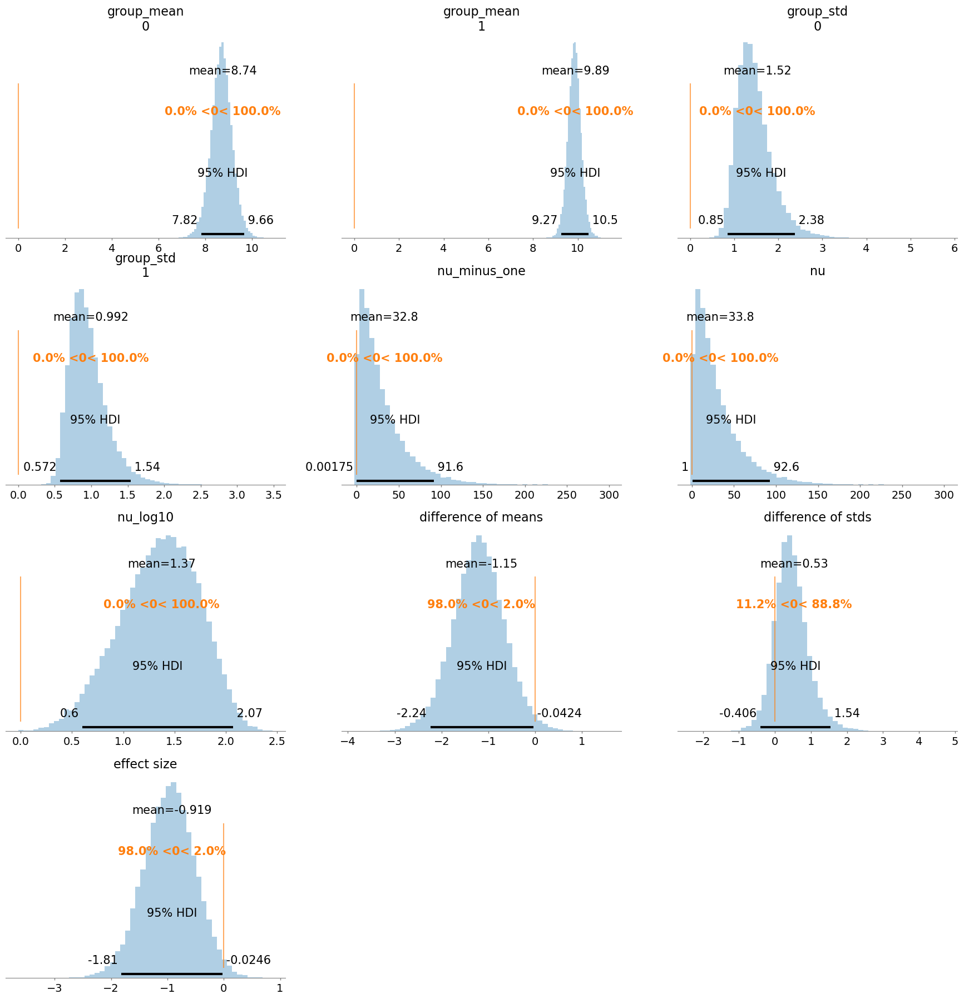

In [51]:
#Plot
az.plot_posterior(idata_lrn_e2, 
                  kind="hist",
                  combine_dims={"sample"},
                  bins=50,
                  point_estimate="mean", 
                  ref_val=0,
                  round_to=3,
                  hdi_prob=0.95);

RPE mean [95% HDI] = 8.74 [ 7.82 9.66 ]
TE mean [95% HDI] = 9.89 [ 9.27 10.48 ]
Difference of means = -1.15 [ -2.24 -0.04 ]


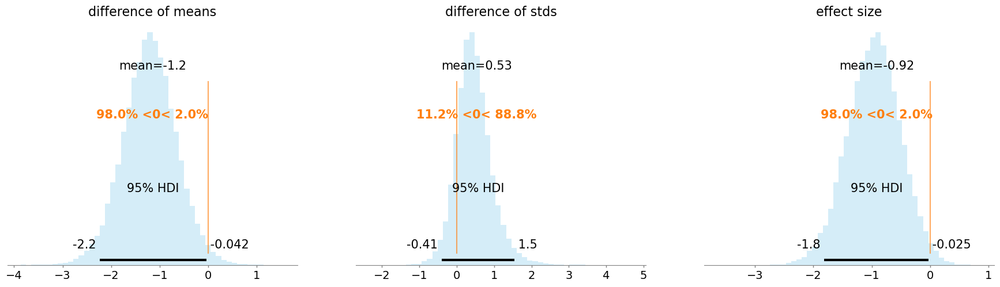

In [50]:
plot_post_simple_comparison(idata_lrn_e2, grp_names, round_to=2)

### Error

In [52]:
#Run the model
model_error_e2, idata_error_e2 = robust_bayesian_mixed_model_anova(between_subj_var=df2.group, 
                                                                   within_subj_var=df2.time, 
                                                                   subj_id=df2.subj_id, 
                                                                   y=df2.error, 
                                                                   n_draws=n_samples, 
                                                                   rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a0, sigma_B, aB, sigma_W, aW, sigma_BxW, aBxW, sigma_S, aS, sigma, nu_minus1]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 1824 seconds.


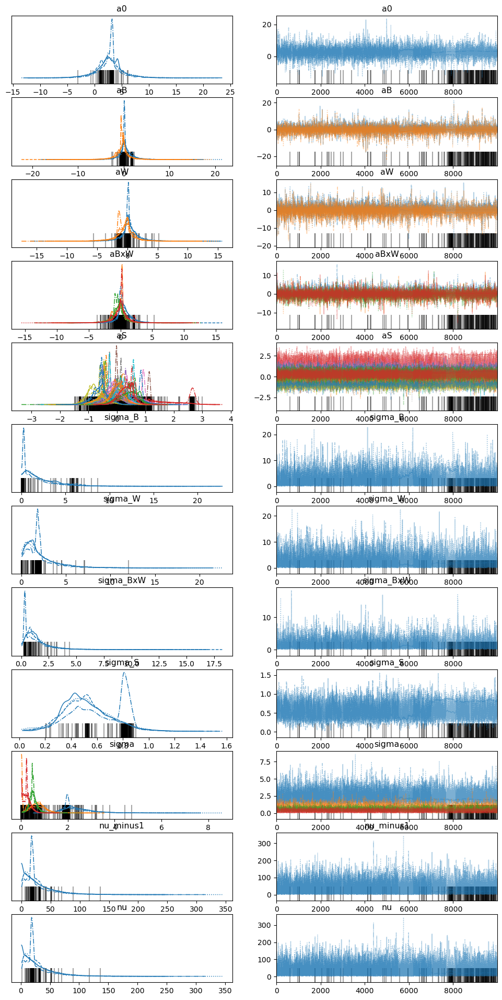

In [53]:
az.plot_trace(idata_error_e2);

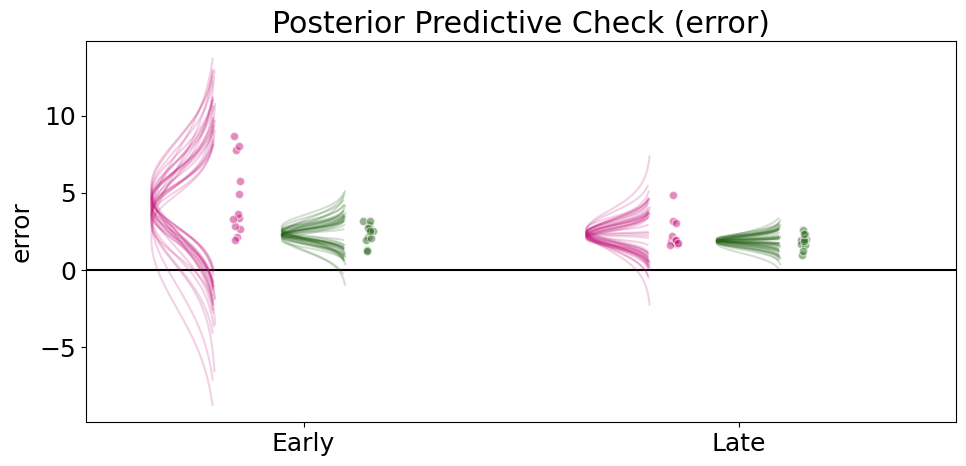

In [54]:
# Convert coefficients to sum-to-zero deflections
post_error_e2 = bst.convert_to_sum_to_zero(idata_error_e2, 
                                           df2.group, 
                                           df2.time, 
                                           df2.subj_id)

#Plot posterior predictive
plot_posterior_predictive_anova_robust(between_subj=df2.group, 
                                       within_subj=df2.time, 
                                       y=df2.error, 
                                       post=post_error_e2, 
                                       n_mustaches=25)

Interactions:
Posterior for RPE Early = 4.038 [2.55  5.545]
Posterior for TE Early = 2.382 [2.048 2.721]
RPE vs TE @ Early = 1.656 [0.169 3.215]
 
Posterior for RPE Late = 2.296 [1.803 2.79 ]
Posterior for TE Late = 1.88 [1.681 2.077]
RPE vs TE @ Late = 0.417 [-0.107  0.933]
 


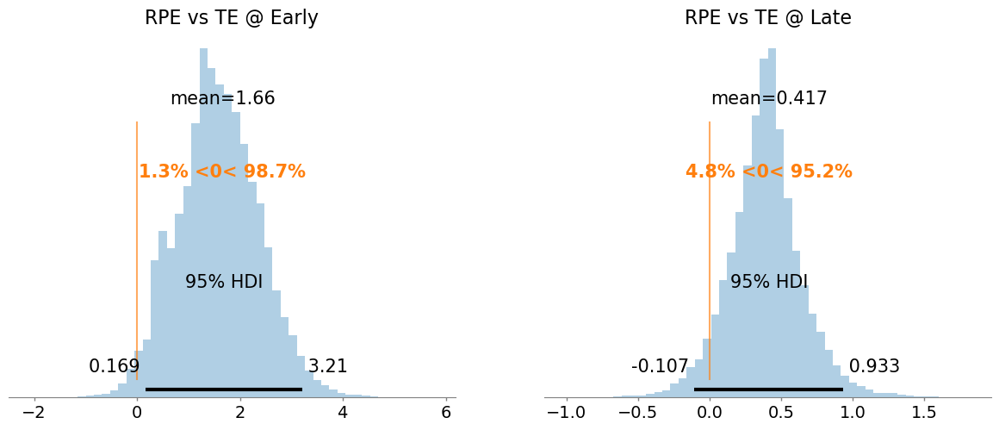

In [55]:
#Between subject contrasts at both timepoints
contrast_dict_e2error = plot_between_contrasts(post_error_e2, 
                                               between_subj=df2.group, 
                                               within_subj=df2.time, 
                                               round_to=3)

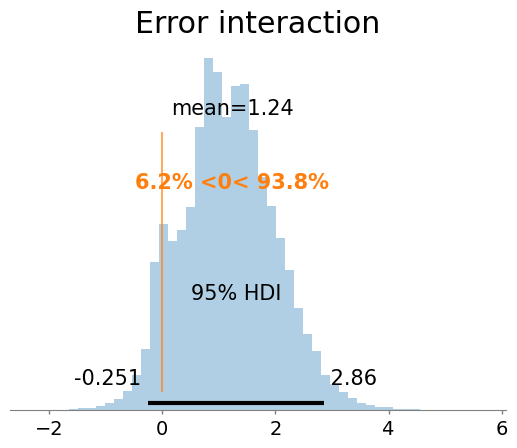

In [56]:
#Interaction effect

#Index posteriors
post_rpe_early = post_error_e2.b0 + post_error_e2.bB.sel(between_subj='RPE') + post_error_e2.bW.sel(within_subj='Early') + post_error_e2.bBxW.sel(between_subj='RPE',within_subj='Early')
post_te_early = post_error_e2.b0 + post_error_e2.bB.sel(between_subj='TE') + post_error_e2.bW.sel(within_subj='Early') + post_error_e2.bBxW.sel(between_subj='TE',within_subj='Early')

post_rpe_late = post_error_e2.b0 + post_error_e2.bB.sel(between_subj='RPE') + post_error_e2.bW.sel(within_subj='Late') + post_error_e2.bBxW.sel(between_subj='RPE',within_subj='Late')
post_te_late = post_error_e2.b0 + post_error_e2.bB.sel(between_subj='TE') + post_error_e2.bW.sel(within_subj='Late') + post_error_e2.bBxW.sel(between_subj='TE',within_subj='Late')

#Differences
time_diff_rpe = post_rpe_early - post_rpe_late
time_diff_te = post_te_early - post_te_late
error_interaction_e2 = time_diff_rpe - time_diff_te

#Plot
az.plot_posterior(error_interaction_e2, 
                  kind="hist",
                  combine_dims={"sample"},
                  bins=50,
                  point_estimate="mean", 
                  ref_val=0,
                  round_to=3,
                  hdi_prob=0.95);
plt.title('Error interaction')
plt.show()

### Percent success

In [57]:
#Run the model
model_success_e2, idata_success_e2 = robust_bayesian_mixed_model_anova(between_subj_var=df2.group, 
                                                                       within_subj_var=df2.time, 
                                                                       subj_id=df2.subj_id, 
                                                                       y=df2.success, 
                                                                       n_draws=n_samples, 
                                                                       rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a0, sigma_B, aB, sigma_W, aW, sigma_BxW, aBxW, sigma_S, aS, sigma, nu_minus1]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 2388 seconds.


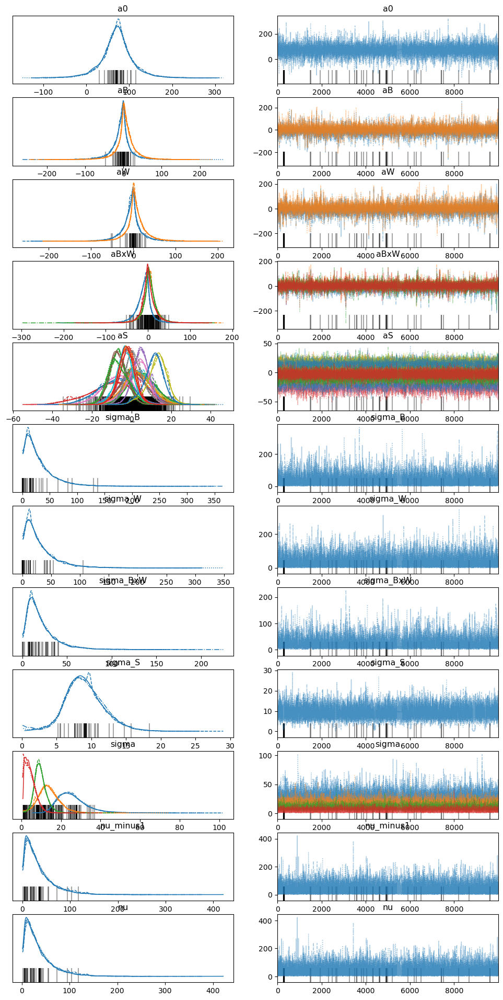

In [58]:
az.plot_trace(idata_success_e2);

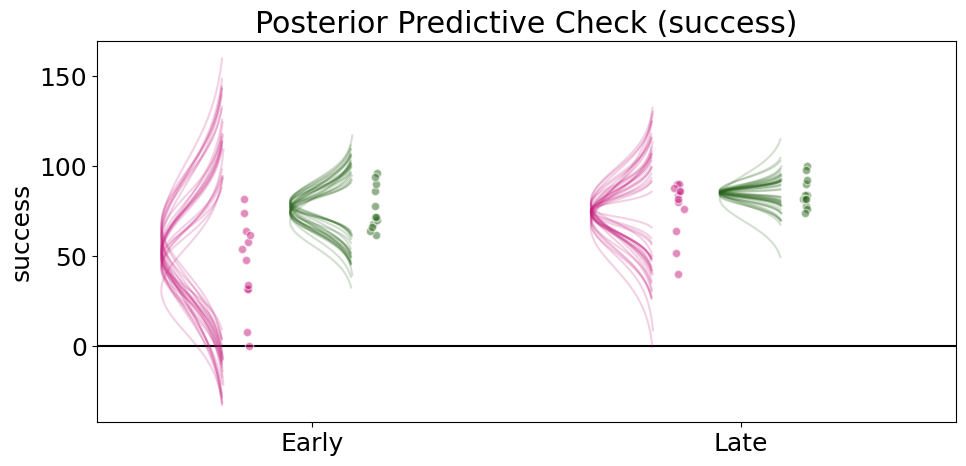

In [59]:
# Convert coefficients to sum-to-zero deflections
post_success_e2 = bst.convert_to_sum_to_zero(idata_success_e2, 
                                                 df2.group, 
                                                 df2.time, 
                                                 df2.subj_id)

#Plot posterior predictive
plot_posterior_predictive_anova_robust(between_subj=df2.group, 
                                       within_subj=df2.time, 
                                       y=df2.success, 
                                       post=post_success_e2, 
                                       n_mustaches=25)

Interactions:
Posterior for RPE Early = 49.848 [33.647 66.213]
Posterior for TE Early = 76.24 [69.969 82.087]
RPE vs TE @ Early = -26.392 [-43.373  -8.832]
 
Posterior for RPE Late = 76.246 [66.997 85.049]
Posterior for TE Late = 85.18 [81.777 88.52 ]
RPE vs TE @ Late = -8.934 [-18.844   0.228]
 


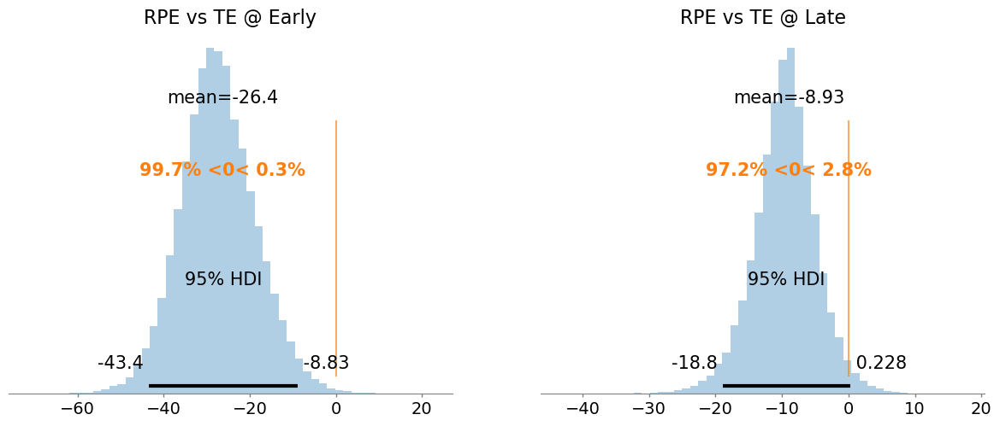

In [60]:
#Between subject contrasts at both timepoints
contrast_dict_e2success = plot_between_contrasts(post_success_e2, 
                                                 between_subj=df2.group, 
                                                 within_subj=df2.time, 
                                                 round_to=3)

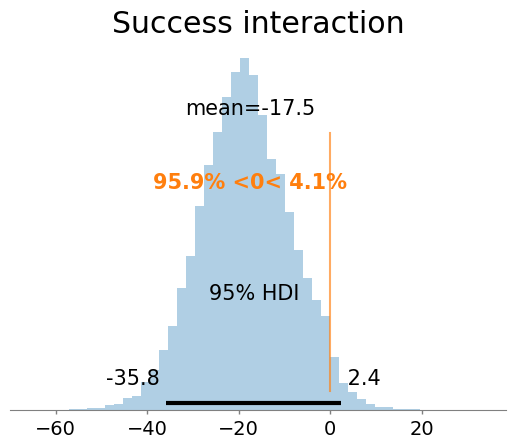

In [61]:
#Interaction effect

#Index posteriors
post_rpe_early = post_success_e2.b0 + post_success_e2.bB.sel(between_subj='RPE') + post_success_e2.bW.sel(within_subj='Early') + post_success_e2.bBxW.sel(between_subj='RPE',within_subj='Early')
post_te_early = post_success_e2.b0 + post_success_e2.bB.sel(between_subj='TE') + post_success_e2.bW.sel(within_subj='Early') + post_success_e2.bBxW.sel(between_subj='TE',within_subj='Early')

post_rpe_late = post_success_e2.b0 + post_success_e2.bB.sel(between_subj='RPE') + post_success_e2.bW.sel(within_subj='Late') + post_success_e2.bBxW.sel(between_subj='RPE',within_subj='Late')
post_te_late = post_success_e2.b0 + post_success_e2.bB.sel(between_subj='TE') + post_success_e2.bW.sel(within_subj='Late') + post_success_e2.bBxW.sel(between_subj='TE',within_subj='Late')

#Differences
time_diff_rpe = post_rpe_early - post_rpe_late
time_diff_te = post_te_early - post_te_late
success_interaction_e2 = time_diff_rpe - time_diff_te

#Plot
az.plot_posterior(success_interaction_e2, 
                  kind="hist",
                  combine_dims={"sample"},
                  bins=50,
                  point_estimate="mean", 
                  ref_val=0,
                  round_to=3,
                  hdi_prob=0.95);
plt.title('Success interaction')
plt.show()

## Exploration

### Motor Variability

In [62]:
model_var_e2, idata_var_e2 = robust_bayesian_mixed_model_anova(between_subj_var=df2_var.group, 
                                                               within_subj_var=df2_var.time, 
                                                               subj_id=df2_var.subj_id, 
                                                               y=df2_var.variability, 
                                                               n_draws=n_samples,
                                                               rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a0, sigma_B, aB, sigma_W, aW, sigma_BxW, aBxW, sigma_S, aS, sigma, nu_minus1]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 3368 seconds.


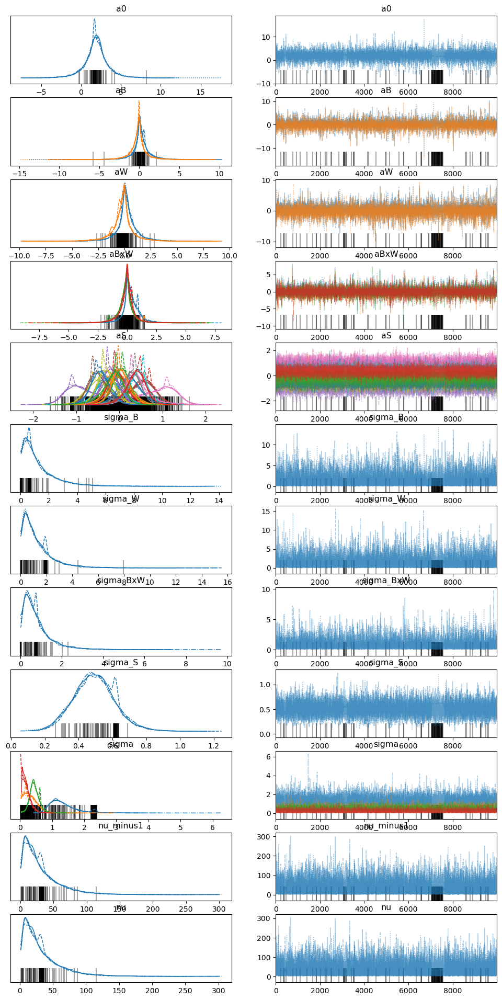

In [63]:
az.plot_trace(idata_var_e2);

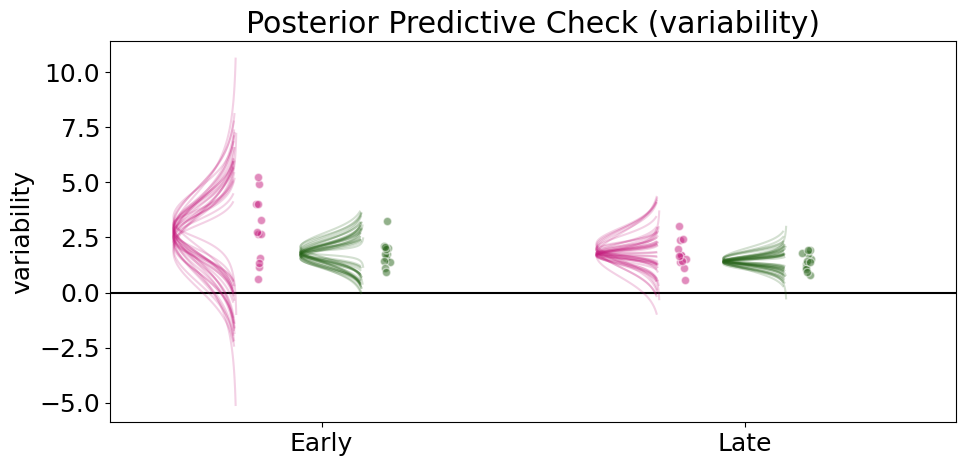

In [64]:
# Convert coefficients to sum-to-zero deflections
post_var_e2 = bst.convert_to_sum_to_zero(idata_var_e2, 
                                         df2_var.group, 
                                         df2_var.time, 
                                         df2_var.subj_id)

#Plot posterior predictive
plot_posterior_predictive_anova_robust(between_subj=df2_var.group, 
                                       within_subj=df2_var.time, 
                                       y=df2_var.variability, 
                                       post=post_var_e2, 
                                       n_mustaches=25)

Interactions:
Posterior for RPE Early = 2.646 [1.87  3.391]
Posterior for TE Early = 1.777 [1.491 2.069]
RPE vs TE @ Early = 0.869 [0.068 1.649]
 
Posterior for RPE Late = 1.747 [1.493 2.002]
Posterior for TE Late = 1.417 [1.265 1.563]
RPE vs TE @ Late = 0.329 [0.028 0.604]
 


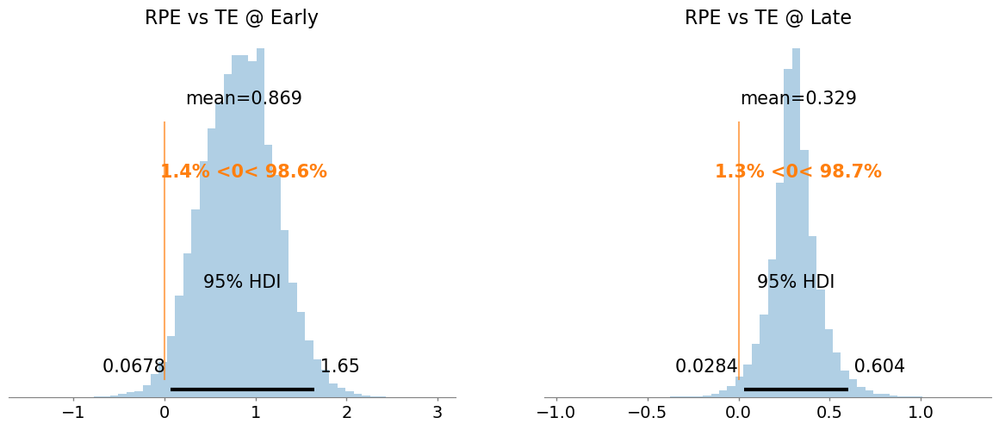

In [65]:
#Between subject contrasts at both timepoints
contrast_dict_e2var = plot_between_contrasts(post_var_e2, 
                                             between_subj=df2_var.group, 
                                             within_subj=df2_var.time, 
                                             round_to=3)

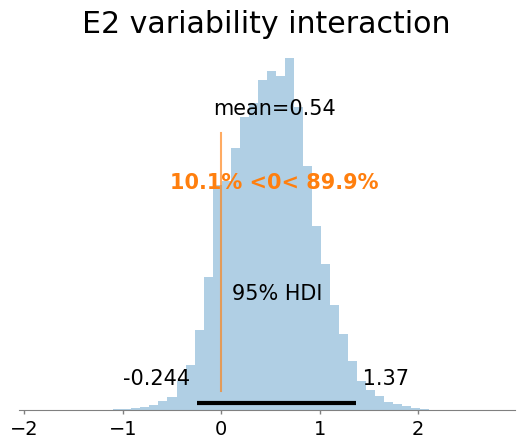

In [66]:
#Interaction effect

#Index posteriors
post_rpe_early = post_var_e2.b0 + post_var_e2.bB.sel(between_subj='RPE') + post_var_e2.bW.sel(within_subj='Early') + post_var_e2.bBxW.sel(between_subj='RPE',within_subj='Early')
post_te_early = post_var_e2.b0 + post_var_e2.bB.sel(between_subj='TE') + post_var_e2.bW.sel(within_subj='Early') + post_var_e2.bBxW.sel(between_subj='TE',within_subj='Early')

post_rpe_late = post_var_e2.b0 + post_var_e2.bB.sel(between_subj='RPE') + post_var_e2.bW.sel(within_subj='Late') + post_var_e2.bBxW.sel(between_subj='RPE',within_subj='Late')
post_te_late = post_var_e2.b0 + post_var_e2.bB.sel(between_subj='TE') + post_var_e2.bW.sel(within_subj='Late') + post_var_e2.bBxW.sel(between_subj='TE',within_subj='Late')

#Differences
time_diff_rpe = post_rpe_early - post_rpe_late
time_diff_te = post_te_early - post_te_late
e2var_interaction = time_diff_rpe - time_diff_te

#Plot
az.plot_posterior(e2var_interaction, 
                  kind="hist",
                  combine_dims={"sample"},
                  bins=50,
                  point_estimate="mean", 
                  ref_val=0,
                  round_to=3,
                  hdi_prob=0.95);
plt.title('E2 variability interaction')
plt.show()

### Win stay lose shift

In [67]:
model_exp_e2, idata_exp_e2 = robust_bayesian_mixed_model_anova(between_subj_var=df2_var.group, 
                                                               within_subj_var=df2_var.exp_time, 
                                                               subj_id=df2_var.subj_id, 
                                                               y=df2_var.wsls, 
                                                               n_draws=n_samples,
                                                               rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a0, sigma_B, aB, sigma_W, aW, sigma_BxW, aBxW, sigma_S, aS, sigma, nu_minus1]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 3066 seconds.


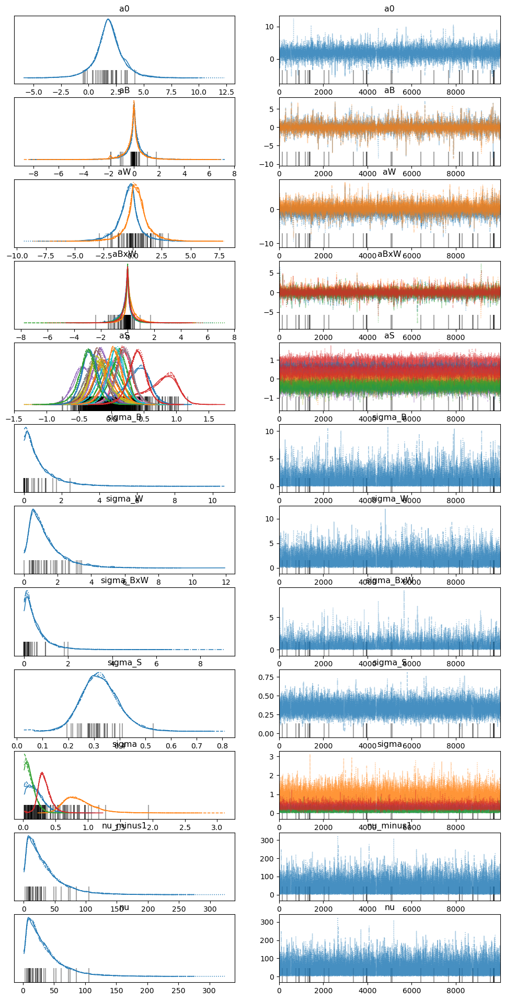

In [68]:
az.plot_trace(idata_exp_e2);

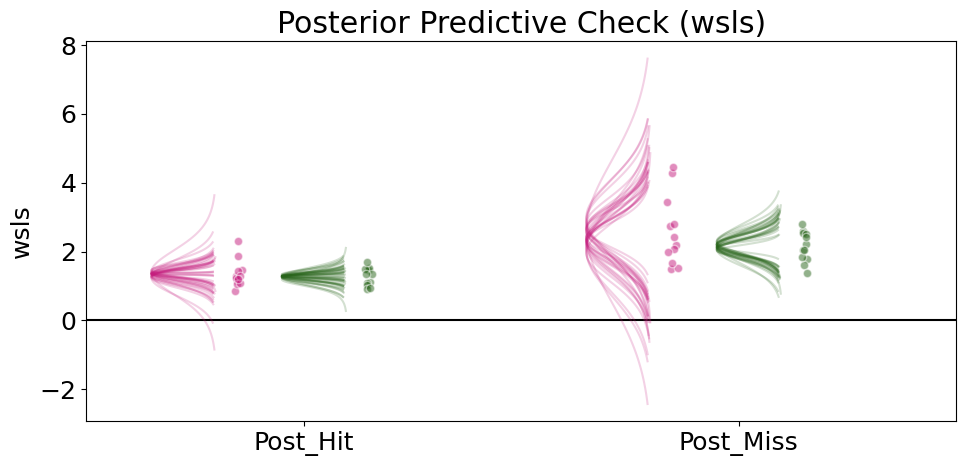

In [69]:
# Convert coefficients to sum-to-zero deflections
post_exp_e2 = bst.convert_to_sum_to_zero(idata_exp_e2, 
                                               df2_var.group, 
                                               df2_var.exp_time, 
                                               df2_var.subj_id)

#Plot posterior predictive
plot_posterior_predictive_anova_robust(between_subj=df2_var.group, 
                                       within_subj=df2_var.exp_time, 
                                       y=df2_var.wsls, 
                                       post=post_exp_e2, 
                                       n_mustaches=25)

Interactions:
Posterior for RPE Post_Hit = 1.358 [1.22  1.504]
Posterior for TE Post_Hit = 1.288 [1.205 1.383]
RPE vs TE @ Post_Hit = 0.07 [-0.095  0.231]
 
Posterior for RPE Post_Miss = 2.459 [1.982 2.957]
Posterior for TE Post_Miss = 2.154 [1.949 2.36 ]
RPE vs TE @ Post_Miss = 0.305 [-0.174  0.857]
 


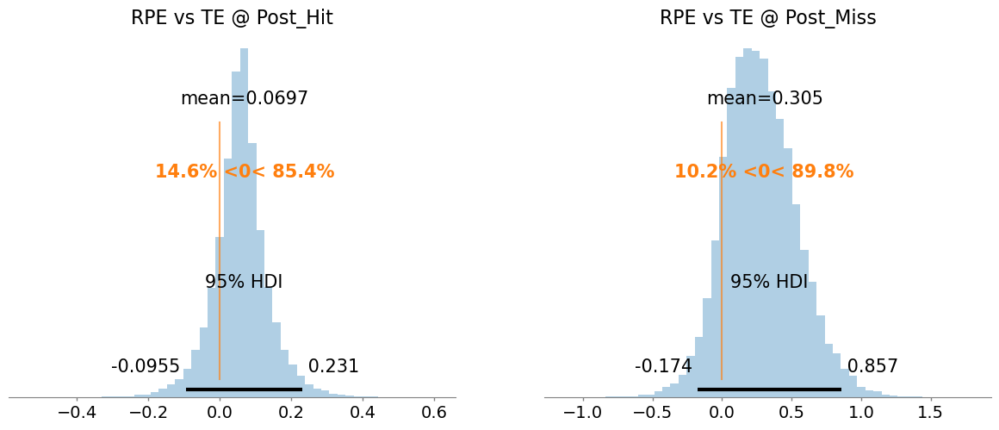

In [70]:
#Between subject contrasts at both timepoints
contrast_dict_e2wsls = plot_between_contrasts(post_exp_e2, 
                                              between_subj=df2_var.group, 
                                              within_subj=df2_var.exp_time, 
                                              round_to=3)

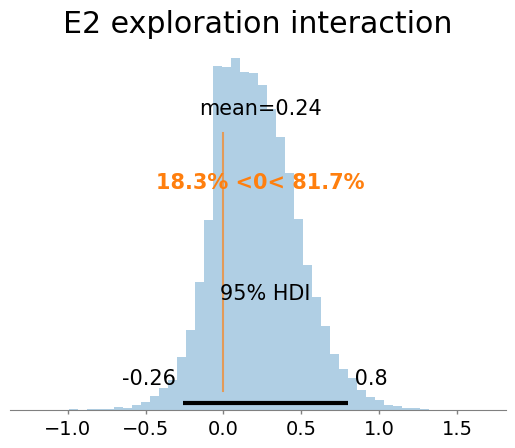

In [71]:
#Interaction effect

#Index posteriors
post_rpe_hit = post_exp_e2.b0 + post_exp_e2.bB.sel(between_subj='RPE') + post_exp_e2.bW.sel(within_subj='Post_Hit') + post_exp_e2.bBxW.sel(between_subj='RPE',within_subj='Post_Hit')
post_te_hit = post_exp_e2.b0 + post_exp_e2.bB.sel(between_subj='TE') + post_exp_e2.bW.sel(within_subj='Post_Hit') + post_exp_e2.bBxW.sel(between_subj='TE',within_subj='Post_Hit')

post_rpe_miss = post_exp_e2.b0 + post_exp_e2.bB.sel(between_subj='RPE') + post_exp_e2.bW.sel(within_subj='Post_Miss') + post_exp_e2.bBxW.sel(between_subj='RPE',within_subj='Post_Miss')
post_te_miss = post_exp_e2.b0 + post_exp_e2.bB.sel(between_subj='TE') + post_exp_e2.bW.sel(within_subj='Post_Miss') + post_exp_e2.bBxW.sel(between_subj='TE',within_subj='Post_Miss')

#Differences
diff_rpe = post_rpe_miss - post_rpe_hit
diff_te = post_te_miss - post_te_hit
e2exp_interaction = diff_rpe - diff_te

#Plot
az.plot_posterior(e2exp_interaction, 
                  kind="hist",
                  combine_dims={"sample"},
                  bins=50,
                  point_estimate="mean", 
                  ref_val=0,
                  round_to=2,
                  hdi_prob=0.95);
plt.title('E2 exploration interaction')
plt.show()

## Retention

### Retention percent

In [72]:
#Run the model
model_retprct_e2, idata_retprct_e2 = robust_bayesian_mixed_model_anova(between_subj_var=df2.group, 
                                                                       within_subj_var=df2.time_ret, 
                                                                       subj_id=df2.subj_id, 
                                                                       y=df2.ret_prct, 
                                                                       n_draws=n_samples, 
                                                                       rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a0, sigma_B, aB, sigma_W, aW, sigma_BxW, aBxW, sigma_S, aS, sigma, nu_minus1]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 836 seconds.


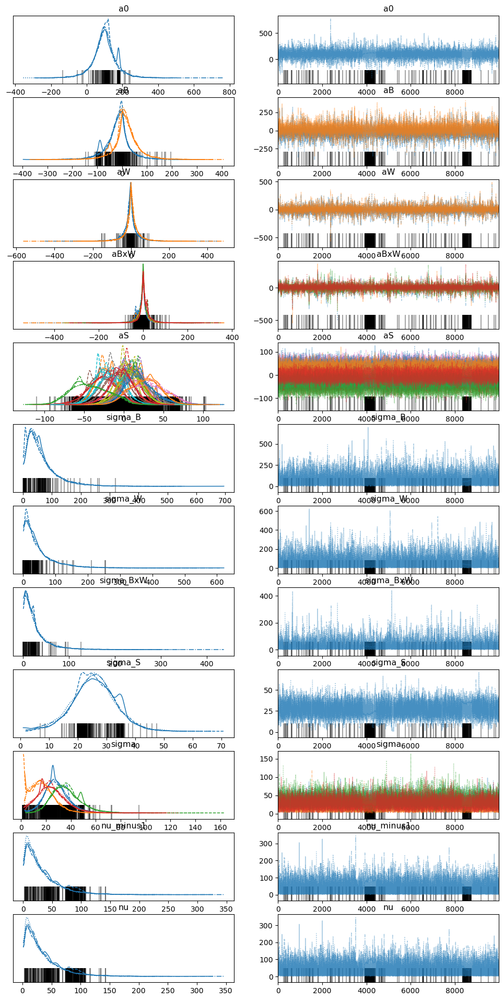

In [73]:
az.plot_trace(idata_retprct_e2);

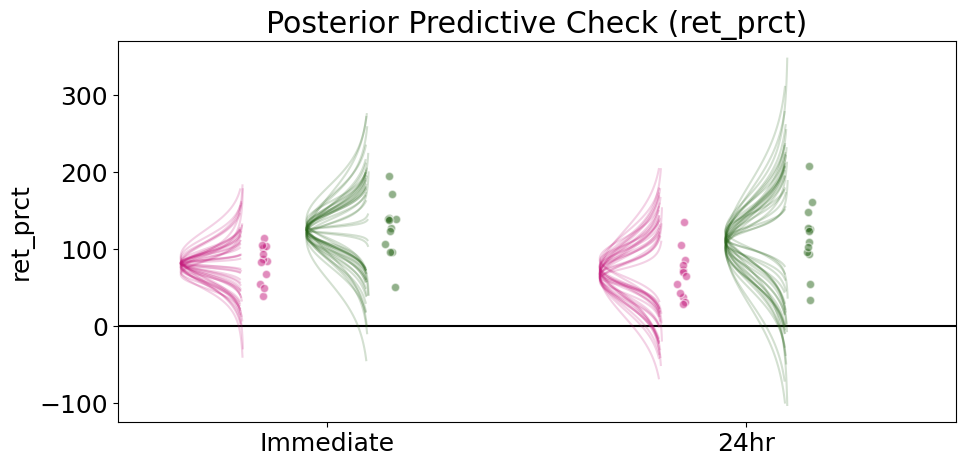

In [74]:
# Convert coefficients to sum-to-zero deflections
post_retprct_e2 = bst.convert_to_sum_to_zero(idata_retprct_e2, 
                                                 df2.group, 
                                                 df2.time_ret, 
                                                 df2.subj_id)

#Plot posterior predictive
plot_posterior_predictive_anova_robust(between_subj=df2.group, 
                                       within_subj=df2.time_ret, 
                                       y=df2.ret_prct, 
                                       post=post_retprct_e2, 
                                       n_mustaches=25)

Interactions:
Posterior for RPE Immediate = 82.07 [70.299 94.246]
Posterior for TE Immediate = 126.428 [110.287 142.529]
RPE vs TE @ Immediate = -44.358 [-63.326 -24.943]
 
Posterior for RPE 24hr = 68.821 [51.559 85.618]
Posterior for TE 24hr = 114.579 [ 93.738 135.534]
RPE vs TE @ 24hr = -45.757 [-71.404 -20.03 ]
 


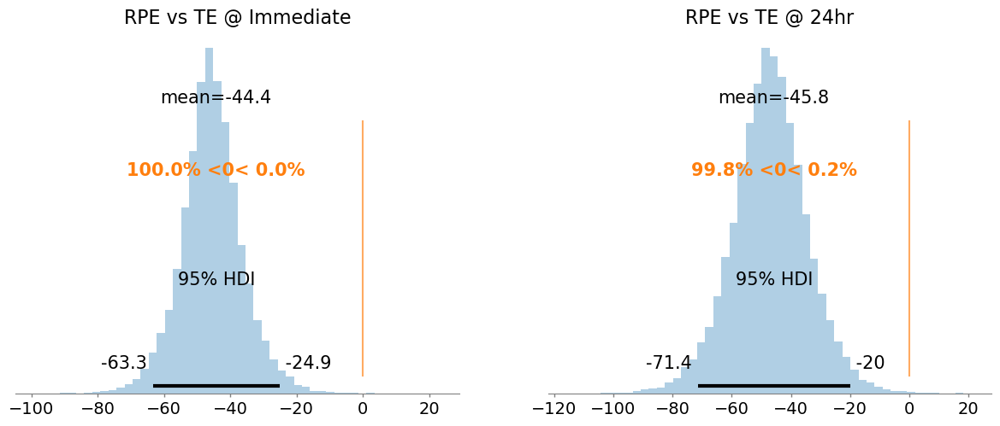

In [75]:
#Between subject contrasts at both timepoints
contrast_dict_retprct = plot_between_contrasts(post_retprct_e2, 
                                               between_subj=df2.group, 
                                               within_subj=df2.time_ret, 
                                               round_to=3)

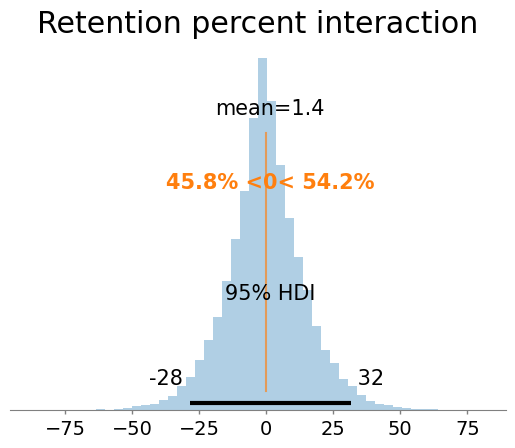

In [76]:
#Interaction effect

#Index posteriors
post_rpe_immediate = post_retprct_e2.b0 + post_retprct_e2.bB.sel(between_subj='RPE') + post_retprct_e2.bW.sel(within_subj='Immediate') + post_retprct_e2.bBxW.sel(between_subj='RPE',within_subj='Immediate')
post_te_immediate = post_retprct_e2.b0 + post_retprct_e2.bB.sel(between_subj='TE') + post_retprct_e2.bW.sel(within_subj='Immediate') + post_retprct_e2.bBxW.sel(between_subj='TE',within_subj='Immediate')

post_rpe_24hr = post_retprct_e2.b0 + post_retprct_e2.bB.sel(between_subj='RPE') + post_retprct_e2.bW.sel(within_subj='24hr') + post_retprct_e2.bBxW.sel(between_subj='RPE',within_subj='24hr')
post_te_24hr = post_retprct_e2.b0 + post_retprct_e2.bB.sel(between_subj='TE') + post_retprct_e2.bW.sel(within_subj='24hr') + post_retprct_e2.bBxW.sel(between_subj='TE',within_subj='24hr')

#Differences
diff_rpe = post_rpe_immediate - post_rpe_24hr
diff_te = post_te_immediate - post_te_24hr
retprct_interaction = diff_rpe - diff_te

#Plot
az.plot_posterior(retprct_interaction, 
                  kind="hist",
                  combine_dims={"sample"},
                  bins=50,
                  point_estimate="mean", 
                  ref_val=0,
                  round_to=2,
                  hdi_prob=0.95);
plt.title('Retention percent interaction')
plt.show()

### Retention accuracy

In [77]:
#Run the model
model_reterr_e2, idata_reterr_e2 = robust_bayesian_mixed_model_anova(between_subj_var=df2.group, 
                                                                     within_subj_var=df2.time_ret, 
                                                                     subj_id=df2.subj_id, 
                                                                     y=df2.ret_error, 
                                                                     n_draws=n_samples, 
                                                                     rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a0, sigma_B, aB, sigma_W, aW, sigma_BxW, aBxW, sigma_S, aS, sigma, nu_minus1]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 807 seconds.


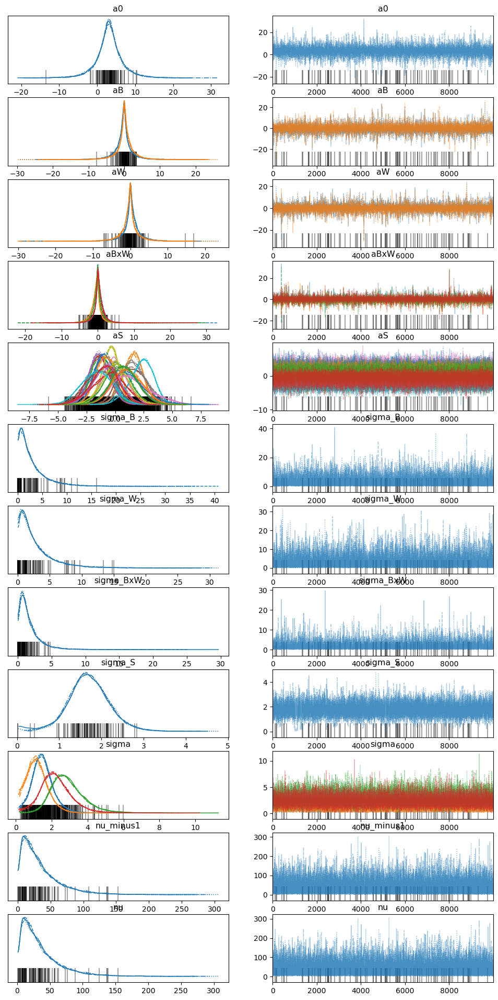

In [78]:
az.plot_trace(idata_reterr_e2);

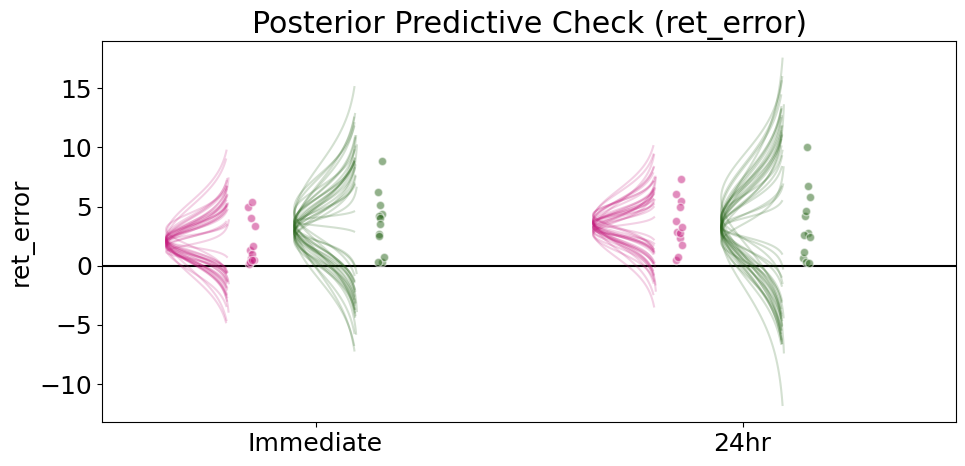

In [79]:
# Convert coefficients to sum-to-zero deflections
post_reterr_e2 = bst.convert_to_sum_to_zero(idata_reterr_e2, 
                                            df2.group, 
                                            df2.time_ret, 
                                            df2.subj_id)

#Plot posterior predictive
plot_posterior_predictive_anova_robust(between_subj=df2.group, 
                                       within_subj=df2.time_ret, 
                                       y=df2.ret_error, 
                                       post=post_reterr_e2, 
                                       n_mustaches=25)

Interactions:
Posterior for RPE Immediate = 2.057 [1.238 2.911]
Posterior for TE Immediate = 3.413 [1.994 4.735]
RPE vs TE @ Immediate = -1.356 [-2.943  0.197]
 
Posterior for RPE 24hr = 3.394 [2.403 4.31 ]
Posterior for TE 24hr = 3.527 [1.824 5.129]
RPE vs TE @ 24hr = -0.133 [-2.01   1.678]
 


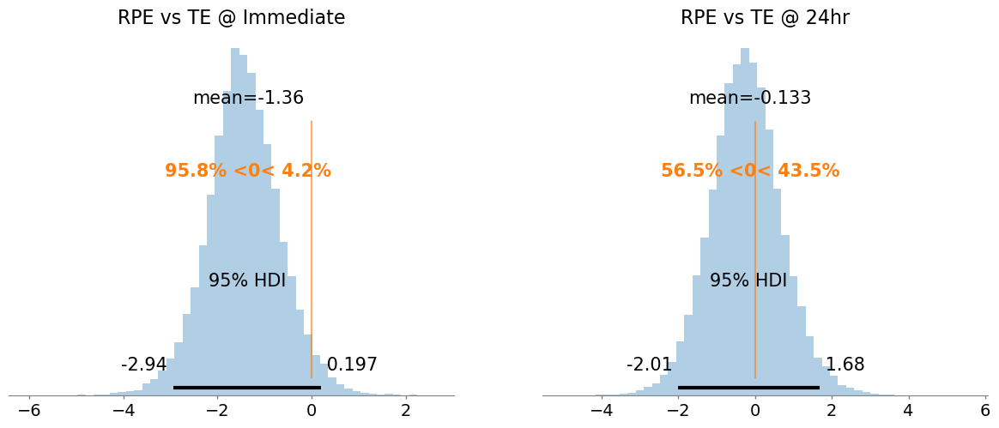

In [80]:
#Between subject contrasts at both timepoints
contrast_dict_retacc = plot_between_contrasts(post_reterr_e2, 
                                              between_subj=df2.group, 
                                              within_subj=df2.time_ret, 
                                              round_to=3)

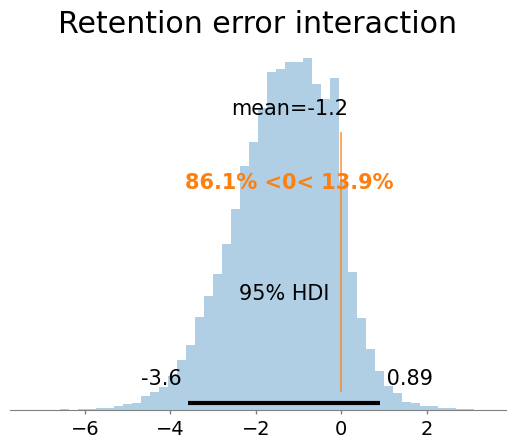

In [81]:
#Interaction effect

#Index posteriors
post_rpe_immediate = post_reterr_e2.b0 + post_reterr_e2.bB.sel(between_subj='RPE') + post_reterr_e2.bW.sel(within_subj='Immediate') + post_reterr_e2.bBxW.sel(between_subj='RPE',within_subj='Immediate')
post_te_immediate = post_reterr_e2.b0 + post_reterr_e2.bB.sel(between_subj='TE') + post_reterr_e2.bW.sel(within_subj='Immediate') + post_reterr_e2.bBxW.sel(between_subj='TE',within_subj='Immediate')

post_rpe_24hr = post_reterr_e2.b0 + post_reterr_e2.bB.sel(between_subj='RPE') + post_reterr_e2.bW.sel(within_subj='24hr') + post_reterr_e2.bBxW.sel(between_subj='RPE',within_subj='24hr')
post_te_24hr = post_reterr_e2.b0 + post_reterr_e2.bB.sel(between_subj='TE') + post_reterr_e2.bW.sel(within_subj='24hr') + post_reterr_e2.bBxW.sel(between_subj='TE',within_subj='24hr')

#Differences
diff_rpe = post_rpe_immediate - post_rpe_24hr
diff_te = post_te_immediate - post_te_24hr
reterr_interaction = diff_rpe - diff_te

#Plot
az.plot_posterior(reterr_interaction, 
                  kind="hist",
                  combine_dims={"sample"},
                  bins=50,
                  point_estimate="mean", 
                  ref_val=0,
                  round_to=2,
                  hdi_prob=0.95);
plt.title('Retention error interaction')
plt.show()

### Post hoc analysis

#### Load data

In [4]:
#Change the directory
os.chdir('/Users/jonathanwood/Documents/GitHub/Reinforcement-learning-during-locomotion/Docs')

#load the data and index only experiment 2
dfp = pd.read_csv('Data_management.csv')
dfp = dfp[dfp.Exp_Num==2]

#Remove replaced subjects
dfp = dfp[dfp.Replacement.isnull()==True]

#Create an ordered variable based on step length perception
ordered_y = np.zeros(len(dfp), dtype=int)
ordered_y[(dfp.LSLperception=='slightly longer') | (dfp.LSLperception==' slightly longer')] = int(1)
ordered_y[dfp.LSLperception=='longer'] = int(2)

#Grouping variables
x_grp, x_levels_grp, n_levels_grp = bst.parse_categorical(dfp.Group)

In [18]:
#Display the number in each group:
print('Not longer (RPE = ' + str(sum(ordered_y[x_grp==0]==0)) + '; TE = ' + str(sum(ordered_y[x_grp==1]==0)) + ')')
print('Slightly longer (RPE = ' + str(sum(ordered_y[x_grp==0]==1)) + '; TE = ' + str(sum(ordered_y[x_grp==1]==1)) + ')')
print('Longer (RPE = ' + str(sum(ordered_y[x_grp==0]==2)) + '; TE = ' + str(sum(ordered_y[x_grp==1]==2)) + ')')

Not longer (RPE = 3; TE = 0)
Slightly longer (RPE = 6; TE = 6)
Longer (RPE = 3; TE = 6)


#### Difference in perception

In [20]:
with pm.Model() as model:
    c = pm.Normal("c", 
                  mu=[-1,1], 
                  sigma=20,
                  transform=pm.distributions.transforms.ordered)
    mu = pm.Normal("mu", mu=0, sigma=4, shape=2)
    
    y = pm.OrderedProbit("y", cutpoints=c, eta=mu[x_grp], observed=ordered_y)
    tr = pm.sample(1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [c, mu]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 39 seconds.


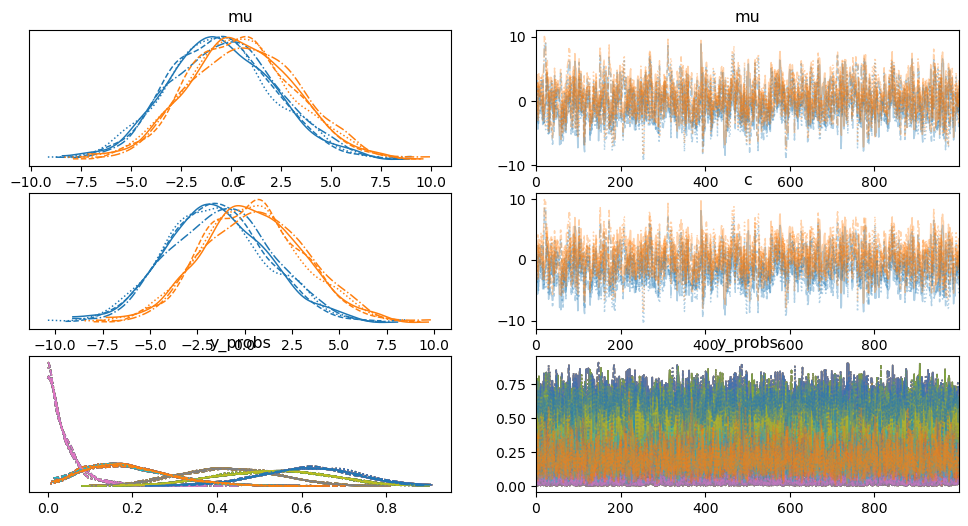

In [21]:
az.plot_trace(tr);

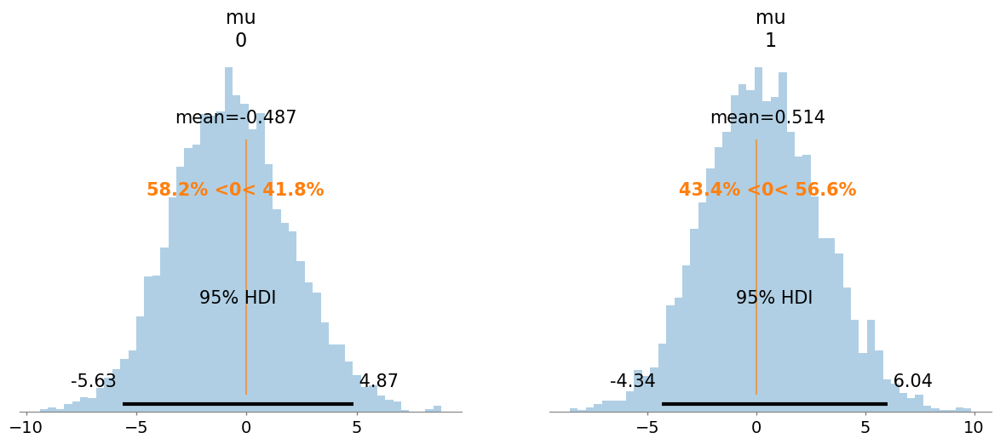

In [22]:
az.plot_posterior(tr,
                  combine_dims={"sample"},
                  var_names=["mu"],
                  kind="hist",
                  bins=50,
                  hdi_prob=0.95,
                  point_estimate="mean",
                  ref_val=0,
                  round_to=3);

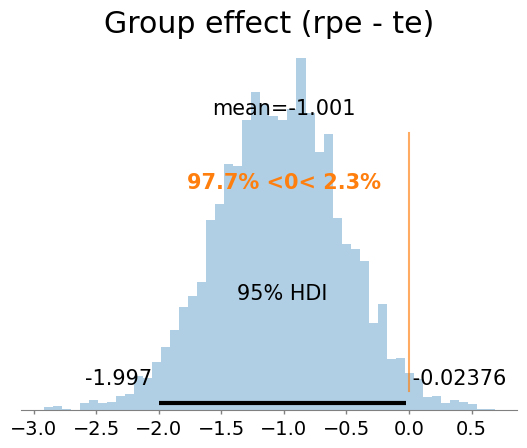

In [23]:
# Group difference
post_percept = az.extract(tr.posterior)
group_diff = post_percept.mu.values[0] - post_percept.mu.values[1]

az.plot_posterior(group_diff,
                  combine_dims={"sample"},
                  kind="hist",
                  bins=50,
                  hdi_prob=0.95,
                  point_estimate="mean",
                  ref_val=0,
                  round_to=4);
plt.title('Group effect (rpe - te)')
plt.show()

### Matching variability

In [5]:
#Change the directory
os.chdir('/Users/jonathanwood/Documents/GitHub/Reinforcement-learning-during-locomotion/Data')

#load the data and index only experiment 2
dfmatch = pd.read_csv('E1_var_match.txt')
dfmatch

,init_wsh,early_wsh,variability,group
0,126.218452,99.781339,2.104235,rpe
1,31.501886,9.191237,2.979681,rpe
2,27.215351,16.354112,1.807154,rpe
3,6.977771,-12.218494,3.985365,rpe
4,-54.216367,-39.756051,2.567087,rpe
5,24.565228,14.706094,4.427185,rpe
6,6.977771,-12.218494,3.985365,te
7,22.589989,21.144009,3.605840,te
8,27.215351,16.354112,1.807154,te
9,31.501886,9.191237,2.979681,te


In [9]:
#Run the model
model_varmatch_e1, idata_varmatch_e1_var = BEST(y=dfmatch.variability, 
                                                group=dfmatch.group,
                                                n_draws=n_samples, rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [group_mean, group_std, nu_minus_one]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 31 seconds.


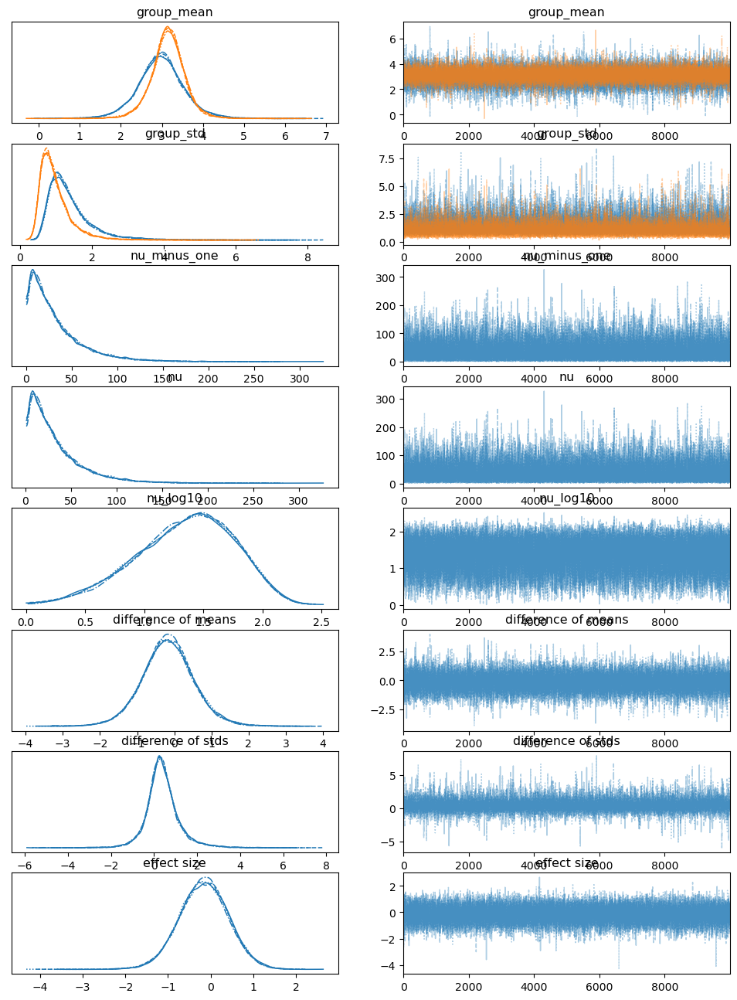

In [10]:
az.plot_trace(idata_varmatch_e1_var);

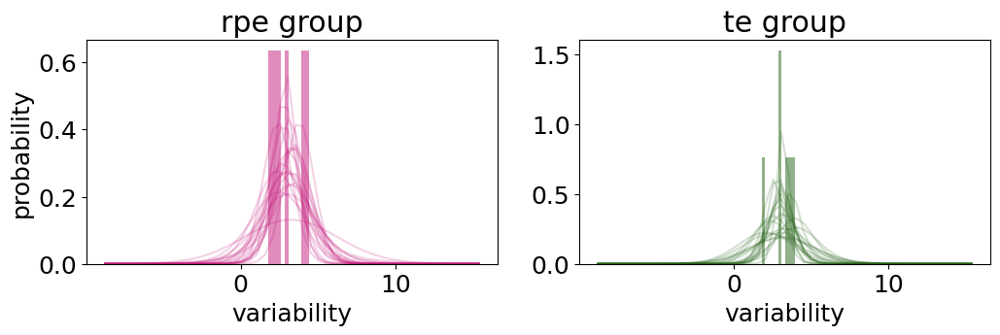

In [12]:
#Extract posterior
post_varmatch_e1_var = az.extract(idata_varmatch_e1_var)

#Plot posterior predictive
plot_post_predictive_ttest(dfmatch.variability, 
                           dfmatch.group, 
                           post_varmatch_e1_var, 
                           n_samps=20)

RPE mean [95% HDI] = 2.97 [ 1.81 4.14 ]
TE mean [95% HDI] = 3.14 [ 2.28 3.95 ]
Difference of means = -0.17 [ -1.57 1.25 ]


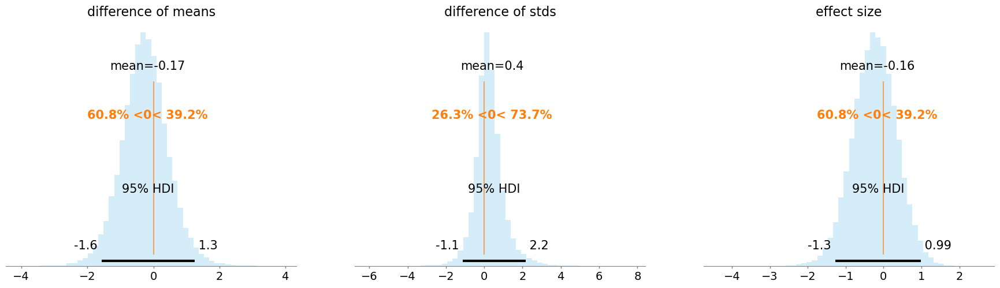

In [13]:
plot_post_simple_comparison(idata_varmatch_e1_var, grp_names, round_to=2)

In [14]:
#Run the model
model_varmatch_e1, idata_varmatch_e1_iw = BEST(y=dfmatch.init_wsh, 
                                               group=dfmatch.group,
                                               n_draws=n_samples, rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [group_mean, group_std, nu_minus_one]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 32 seconds.


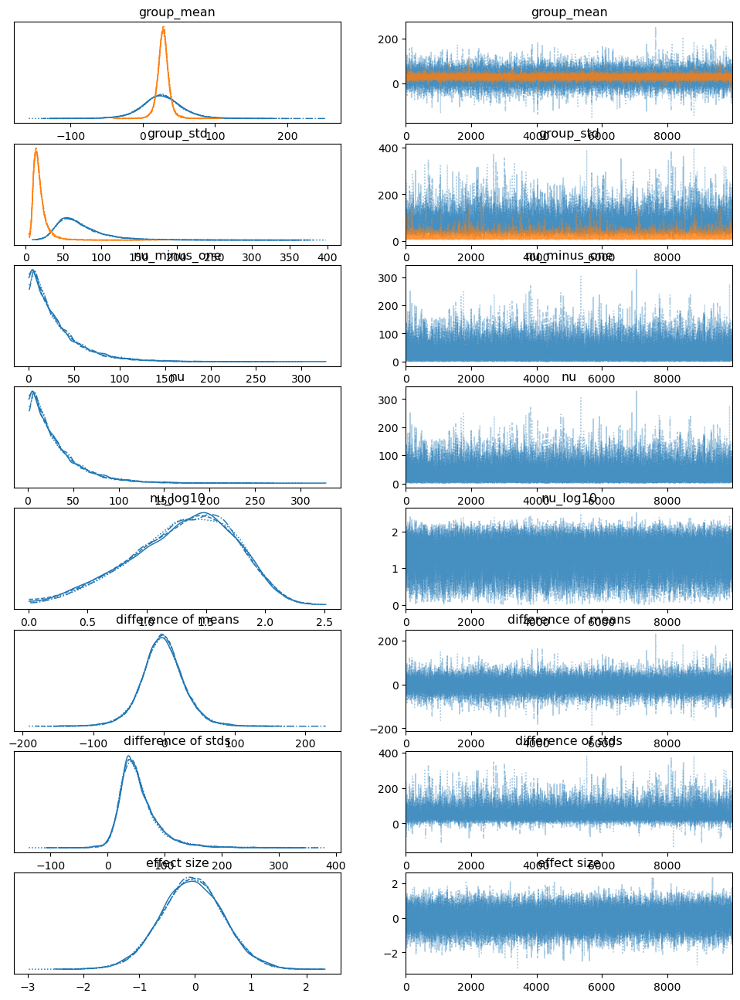

In [15]:
az.plot_trace(idata_varmatch_e1_iw);

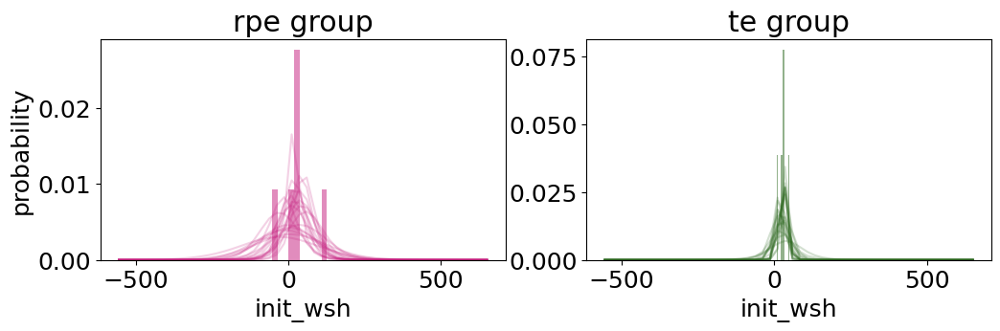

In [16]:
#Extract posterior
post_varmatch_e1_iw = az.extract(idata_varmatch_e1_iw)

#Plot posterior predictive
plot_post_predictive_ttest(dfmatch.init_wsh, 
                           dfmatch.group, 
                           post_varmatch_e1_iw, 
                           n_samps=20)

RPE mean [95% HDI] = 25.97 [ -33.02 86.11 ]
TE mean [95% HDI] = 28.23 [ 12.17 45.7 ]
Difference of means = -2.26 [ -62.06 60.97 ]


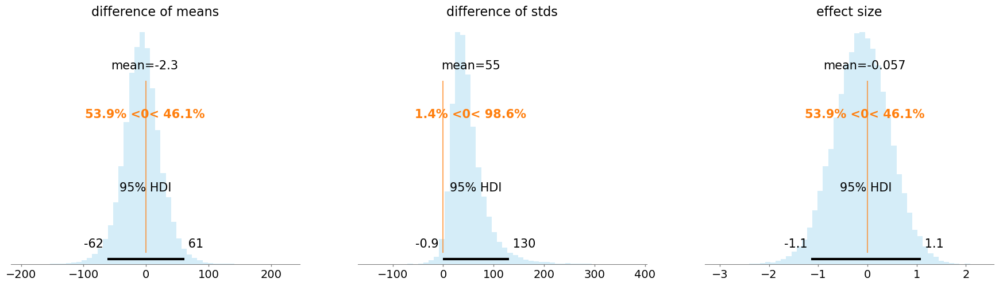

In [17]:
plot_post_simple_comparison(idata_varmatch_e1_iw, grp_names, round_to=2)

In [18]:
#Run the model
model_varmatch_e1, idata_varmatch_e1_ew = BEST(y=dfmatch.early_wsh, 
                                               group=dfmatch.group,
                                               n_draws=n_samples, rnd_seed=seed_num)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [group_mean, group_std, nu_minus_one]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 32 seconds.


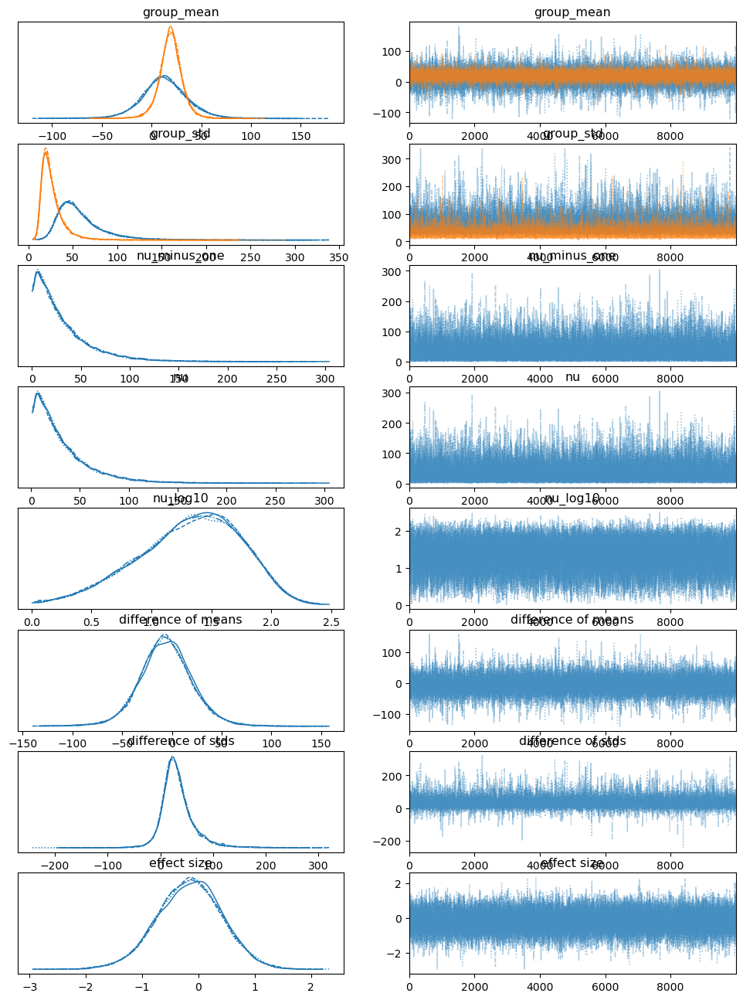

In [19]:
az.plot_trace(idata_varmatch_e1_ew);

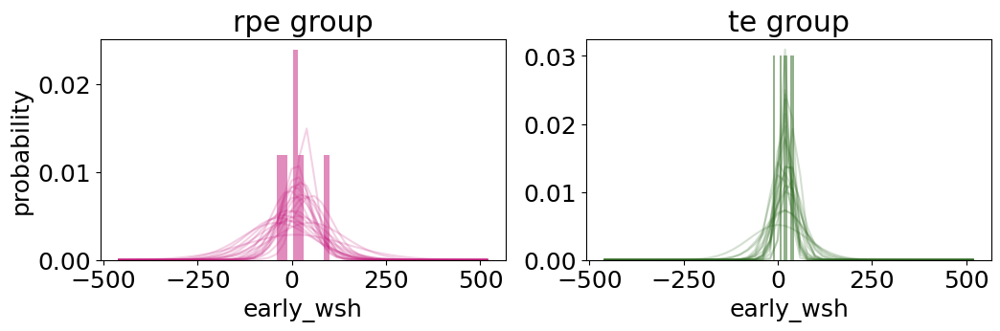

In [20]:
#Extract posterior
post_varmatch_e1_ew = az.extract(idata_varmatch_e1_ew)

#Plot posterior predictive
plot_post_predictive_ttest(dfmatch.early_wsh, 
                           dfmatch.group, 
                           post_varmatch_e1_ew, 
                           n_samps=20)

RPE mean [95% HDI] = 13.15 [ -35.46 61.08 ]
TE mean [95% HDI] = 19.25 [ -5.23 42.85 ]
Difference of means = -6.09 [ -58.97 47.76 ]


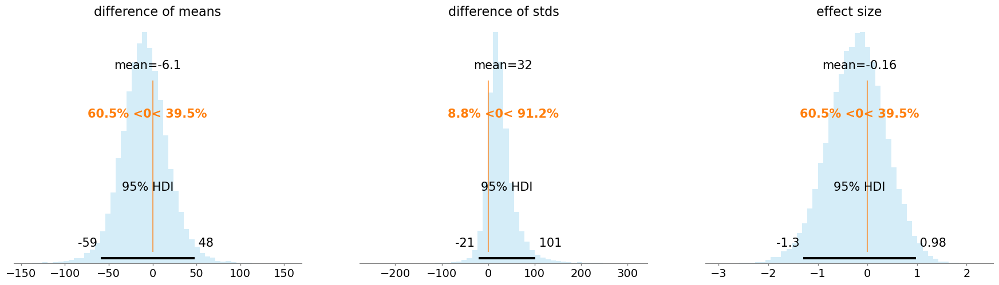

In [21]:
plot_post_simple_comparison(idata_varmatch_e1_ew, grp_names, round_to=2)

# Save HDIs for plotting

In [173]:
contrast_post_dict = {"e1_lrn_diff": post_lrn_e1["difference of means"].values,
                      "e1_lrn_rpe": post_lrn_e1.group_mean[0].values,
                      "e1_error_early": contrast_dict_e1error['RPE vs TE @ Early'].values,
                      "e1_error_late": contrast_dict_e1error['RPE vs TE @ Late'].values,
                      "e1_error_interact": error_interaction_e1.values,
                      "e1_success_early": contrast_dict_e1success['RPE vs TE @ Early'].values,
                      "e1_success_late": contrast_dict_e1success['RPE vs TE @ Late'].values,
                      "e1_success_interact": success_interaction_e1.values,
                      "e1_variability_early": contrast_dict_e1var['RPE vs TE @ Early'].values,
                      "e1_variability_late": contrast_dict_e1var['RPE vs TE @ Late'].values,
                      "e1_variability_interact": e1var_interaction.values,
                      "e1_wsls_early": contrast_dict_e1wsls['RPE vs TE @ Post_Hit'].values,
                      "e1_wsls_late": contrast_dict_e1wsls['RPE vs TE @ Post_Miss'].values,
                      "e1_wsls_interact": e1exp_interaction.values,
                      "e1_washout_imm": contrast_dict_wsh['RPE vs TE @ Early'].values,
                      "e1_washout_early": contrast_dict_wsh['RPE vs TE @ Late'].values,
                      "e1_washout_interact": washout_interaction.values,                                            
                      "e2_lrn_diff": post_lrn_e2["difference of means"].values,
                      "e2_lrn_rpe": post_lrn_e2.group_mean[0].values,
                      "e2_error_early": contrast_dict_e2error['RPE vs TE @ Early'].values,
                      "e2_error_late": contrast_dict_e2error['RPE vs TE @ Late'].values,
                      "e2_error_interact": success_interaction_e2.values,
                      "e2_success_early": contrast_dict_e2success['RPE vs TE @ Early'].values,
                      "e2_success_late": contrast_dict_e2success['RPE vs TE @ Late'].values,
                      "e2_success_interact": error_interaction_e2.values,
                      "e2_variability_early": contrast_dict_e2var['RPE vs TE @ Early'].values,
                      "e2_variability_late": contrast_dict_e2var['RPE vs TE @ Late'].values,
                      "e2_variability_interact": e2var_interaction.values,
                      "e2_wsls_early": contrast_dict_e2wsls['RPE vs TE @ Post_Hit'].values,
                      "e2_wsls_late": contrast_dict_e2wsls['RPE vs TE @ Post_Miss'].values,
                      "e2_wsls_interact": e2exp_interaction.values,
                      "e2_retprct_immediate": contrast_dict_retprct['RPE vs TE @ Immediate'].values,
                      "e2_retprct_24hr": contrast_dict_retprct['RPE vs TE @ 24hr'].values,
                      "e2_retprct_interact": retprct_interaction.values,
                      "e2_retacc_immediate": contrast_dict_retacc['RPE vs TE @ Immediate'].values,
                      "e2_retacc_24hr": contrast_dict_retacc['RPE vs TE @ 24hr'].values,
                      "e2_retacc_interact": reterr_interaction.values}     
contrast_post_df = pd.DataFrame(contrast_post_dict)
data_dir = '/Users/jonathanwood/Documents/GitHub/Reinforcement-learning-during-locomotion/Data'
contrast_post_df.to_csv(data_dir + '/posterior_contrasts.csv')

In [174]:
constrast_hdi_dict = {"e1_lrn_diff": az.hdi(post_lrn_e1["difference of means"].values, hdi_prob=0.95),
                      "e1_lrn_rpe": az.hdi(post_lrn_e1.group_mean[0].values, hdi_prob=0.95),
                      "e1_error_early": az.hdi(contrast_dict_e1error['RPE vs TE @ Early'].values, hdi_prob=0.95),
                      "e1_error_late": az.hdi(contrast_dict_e1error['RPE vs TE @ Late'].values, hdi_prob=0.95),
                      "e1_error_interact": az.hdi(error_interaction_e1.values, hdi_prob=0.95),
                      "e1_success_early": az.hdi(contrast_dict_e1success['RPE vs TE @ Early'].values, hdi_prob=0.95),
                      "e1_success_late": az.hdi(contrast_dict_e1success['RPE vs TE @ Late'].values, hdi_prob=0.95),
                      "e1_success_interact": az.hdi(success_interaction_e1.values, hdi_prob=0.95),
                      "e1_variability_early": az.hdi(contrast_dict_e1var['RPE vs TE @ Early'].values, hdi_prob=0.95),
                      "e1_variability_late": az.hdi(contrast_dict_e1var['RPE vs TE @ Late'].values, hdi_prob=0.95),
                      "e1_variability_interact": az.hdi(e1var_interaction.values, hdi_prob=0.95),
                      "e1_wsls_early": az.hdi(contrast_dict_e1wsls['RPE vs TE @ Post_Hit'].values, hdi_prob=0.95),
                      "e1_wsls_late": az.hdi(contrast_dict_e1wsls['RPE vs TE @ Post_Miss'].values, hdi_prob=0.95),
                      "e1_wsls_interact": az.hdi(e1exp_interaction.values, hdi_prob=0.95),
                      "e1_washout_imm": az.hdi(contrast_dict_wsh['RPE vs TE @ Early'].values, hdi_prob=0.95),
                      "e1_washout_early": az.hdi(contrast_dict_wsh['RPE vs TE @ Late'].values, hdi_prob=0.95),
                      "e1_washout_interact": az.hdi(washout_interaction.values, hdi_prob=0.95),                    
                      "e2_lrn_diff": az.hdi(post_lrn_e2["difference of means"].values, hdi_prob=0.95),
                      "e2_lrn_rpe": az.hdi(post_lrn_e2.group_mean[0].values, hdi_prob=0.95),
                      "e2_error_early": az.hdi(contrast_dict_e2error['RPE vs TE @ Early'].values, hdi_prob=0.95),
                      "e2_error_late": az.hdi(contrast_dict_e2error['RPE vs TE @ Late'].values, hdi_prob=0.95),
                      "e2_error_interact": az.hdi(error_interaction_e2.values, hdi_prob=0.95),
                      "e2_success_early": az.hdi(contrast_dict_e2success['RPE vs TE @ Early'].values, hdi_prob=0.95),
                      "e2_success_late": az.hdi(contrast_dict_e2success['RPE vs TE @ Late'].values, hdi_prob=0.95),
                      "e2_success_interact": az.hdi(success_interaction_e2.values, hdi_prob=0.95),
                      "e2_variability_early": az.hdi(contrast_dict_e2var['RPE vs TE @ Early'].values, hdi_prob=0.95),
                      "e2_variability_late": az.hdi(contrast_dict_e2var['RPE vs TE @ Late'].values, hdi_prob=0.95),
                      "e2_variability_interact": az.hdi(e2var_interaction.values, hdi_prob=0.95),
                      "e2_wsls_early": az.hdi(contrast_dict_e2wsls['RPE vs TE @ Post_Hit'].values, hdi_prob=0.95),
                      "e2_wsls_late": az.hdi(contrast_dict_e2wsls['RPE vs TE @ Post_Miss'].values, hdi_prob=0.95),
                      "e2_wsls_interact": az.hdi(e2exp_interaction.values, hdi_prob=0.95),
                      "e2_retprct_immediate": az.hdi(contrast_dict_retprct['RPE vs TE @ Immediate'].values, hdi_prob=0.95),
                      "e2_retprct_24hr": az.hdi(contrast_dict_retprct['RPE vs TE @ 24hr'].values, hdi_prob=0.95),
                      "e2_retprct_interact": az.hdi(retprct_interaction.values, hdi_prob=0.95),
                      "e2_retacc_immediate": az.hdi(contrast_dict_retacc['RPE vs TE @ Immediate'].values, hdi_prob=0.95),
                      "e2_retacc_24hr": az.hdi(contrast_dict_retacc['RPE vs TE @ 24hr'].values, hdi_prob=0.95),
                      "e2_retacc_interact": az.hdi(reterr_interaction.values, hdi_prob=0.95)}  

post_hdi_df = pd.DataFrame(constrast_hdi_dict, index=['2.5%', '97.5%'])
post_hdi_df.to_csv(data_dir + '/posterior_hdis.csv')